# NGC 5904 Analysis

In [1]:
import matplotlib.pyplot as mp
import read_dao
import sys
import coordinates
import numpy as np
from matplotlib.ticker import ScalarFormatter
from astropy.wcs import WCS
from astropy.io import fits
import optical
import lightcurves
import calibration
import analysis_routines
import variables
import glob
import re
from astropy.stats import sigma_clip
import numpy.ma as ma
import statsmodels.api as sm
%matplotlib inline 

/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [2]:
# cluster specific info
target = 'NGC5904'
folder = '/Volumes/Annie/CRRP/'+target+'/'
optical_dir = '/Volumes/Annie/CRRP/OpticalCatalogs/'
cluster_ra = '15:18:33.22'
cluster_dec = '02:04:51.7'
ebv = 0.03
red_law = [1.0, 0.066, 0.051] 
Rv = 3.1
feh = -1.29
mu = 14.35

## Cluster Snapshot

In [10]:
dtype1 = np.dtype([('img', 'S30'), ('ra', float), ('dec', float)])
ch1_data = np.loadtxt(folder+'I1_centers.txt', dtype=dtype1, usecols=(0,1,2))
ch2_data = np.loadtxt(folder+'I2_centers.txt', dtype=dtype1, usecols=(0,1,2))

#### Plot AOR footprint

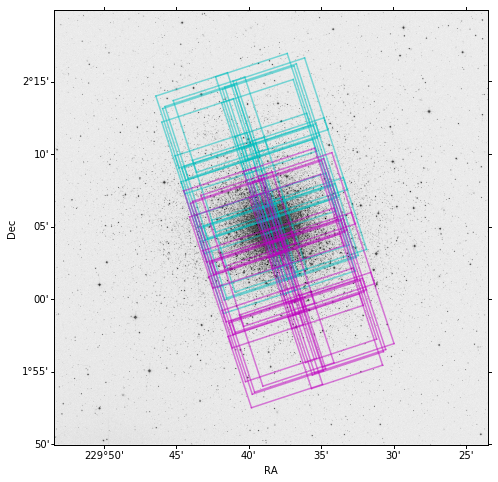

In [13]:
from matplotlib.colors import LogNorm
hdu = fits.open(folder+'dss-'+target+'.fits')[0]
wcs = WCS(hdu.header)
fig = mp.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection=wcs)
mp.imshow(hdu.data, origin='lower', cmap='gray_r')#, norm=LogNorm())

for ind, fits_file in enumerate(ch1_data['img']):
    w = WCS(folder+fits_file)
    ra1, dec1 = w.wcs_pix2world(1, 1, 0)
    ra2, dec2 = w.wcs_pix2world(1, 256, 0)
    ra3, dec3 = w.wcs_pix2world(256, 256, 0)
    ra4, dec4 = w.wcs_pix2world(256, 1, 0)
# Plot [3.6] AOR footprint
  #  mp.plot(ch1_data['ra'][ind], ch1_data['dec'][ind], 'ro')
    ax.plot([ra1, ra2], [dec1, dec2], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra2, ra3], [dec2, dec3], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra3, ra4], [dec3, dec4], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra4, ra1], [dec4, dec1], '-', color='c', alpha=0.5, transform=ax.get_transform('fk5'))
for ind, fits_file in enumerate(ch2_data['img']):
    w = WCS(folder+fits_file)
    ra1, dec1 = w.wcs_pix2world(1, 1, 0)
    ra2, dec2 = w.wcs_pix2world(1, 256, 0)
    ra3, dec3 = w.wcs_pix2world(256, 256, 0)
    ra4, dec4 = w.wcs_pix2world(256, 1, 0)
# Plot [4.5] AOR footprint
  #  mp.plot(ch2_data['ra'][ind], ch2_data['dec'][ind], 'ro')
    ax.plot([ra1, ra2], [dec1, dec2], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra2, ra3], [dec2, dec3], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra3, ra4], [dec3, dec4], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
    ax.plot([ra4, ra1], [dec4, dec1], '-', color='m', alpha=0.5, transform=ax.get_transform('fk5'))
ax.set_xlabel('RA')
ax.set_ylabel('Dec')

x_formatter = ScalarFormatter(useOffset=False)
mp.gca().xaxis.set_major_formatter(x_formatter)
#mp.show()
mp.savefig('NGC5904-map.pdf', format='pdf')

#### Map of source catalog with field boundaries shown

Reading optical catalog for NGC5904...
Finished reading optical catalog.


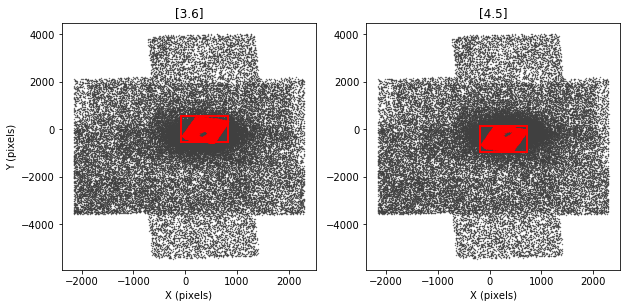

In [3]:
fig = mp.figure(figsize=(10,10))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)

# read optical catalog and add to plots
ids, xcat, ycat, ra, dec = optical.read_optical_fnl(optical_dir, target)
ax1.plot(xcat, ycat, '.', color='0.25', markersize=0.75)
ax2.plot(xcat, ycat, '.', color='0.25', markersize=0.75)

# read boundaries of IRAC data
dtype1 = np.dtype([('xmin', float), ('xmax', float), ('ymin', float), ('ymax', float)])
I1cuts = np.loadtxt(folder+'DeepMosaic/I1-deep-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))
I2cuts = np.loadtxt(folder+'DeepMosaic/I2-deep-cuts.txt', dtype=dtype1, usecols=(1,2,3,4))

ax1.plot([I1cuts['xmin'], I1cuts['xmax']], [I1cuts['ymin'], I1cuts['ymin']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmin'], I1cuts['xmax']], [I1cuts['ymax'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmin'], I1cuts['xmin']], [I1cuts['ymin'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.plot([I1cuts['xmax'], I1cuts['xmax']], [I1cuts['ymin'], I1cuts['ymax']],
    '-', color='r', linewidth=2)
ax1.set_xlabel('X (pixels)')
ax1.set_ylabel('Y (pixels)')
ax1.set_title('[3.6]')
ax2.plot([I2cuts['xmin'], I2cuts['xmax']], [I2cuts['ymin'], I2cuts['ymin']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmin'], I2cuts['xmax']], [I2cuts['ymax'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmin'], I2cuts['xmin']], [I2cuts['ymin'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.plot([I2cuts['xmax'], I2cuts['xmax']], [I2cuts['ymin'], I2cuts['ymax']],
    '-', color='r', linewidth=2)
ax2.set_xlabel('X (pixels)')
ax2.set_title('[4.5]')


# Add transformed catalogs
I1ids, I1x, I1y, I1mag, I1err = read_dao.read_alf(folder+'DeepMosaic/'+target+'_I1_deep_dn.alf')
I2ids, I2x, I2y, I2mag, I2err = read_dao.read_alf(folder+'DeepMosaic/'+target+'_I2_deep_dn.alf')

filesI1, x_offI1, y_offI1, transformI1, dofI1 = read_dao.read_mch(folder+'DeepMosaic/op-I1-deep.mch')
filesI2, x_offI2, y_offI2, transformI2, dofI2 = read_dao.read_mch(folder+'DeepMosaic/op-I2-deep.mch')

xI1 = float(x_offI1[1])+float(transformI1[1][0])*I1x+float(transformI1[1][1])*I1y
yI1 = float(y_offI1[1])+float(transformI1[1][2])*I1x+float(transformI1[1][3])*I1y
xI2 = float(x_offI2[1])+float(transformI2[1][0])*I2x+float(transformI2[1][1])*I2y
yI2 = float(y_offI2[1])+float(transformI2[1][2])*I2x+float(transformI2[1][3])*I2y

ax1.plot(xI1, yI1, '.', markersize=1.8, color='r')
ax2.plot(xI2, yI2, '.', markersize=1.8, color='r')


mp.show()

In [ ]:
calibration.find_lst_stars(target, 'I1', data_dir=folder)
calibration.find_lst_stars(target, 'I2', data_dir=folder)

In [ ]:
calibration.do_ap_phot(target, 'I1', 30, data_dir=folder, dao_dir='/usr/local/phot/')
calibration.do_ap_phot(target, 'I2', 30, data_dir=folder, dao_dir='/usr/local/phot/')

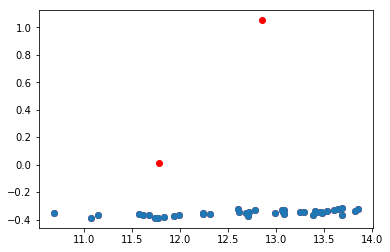

-0.353743589744 0.0194233773354
-0.352384615385 0.0188728748297
There are 45 psf stars.


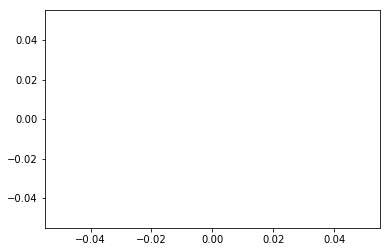

-- --
-- --
There are 45 psf stars.


In [8]:
I1_mosaic_zp, I1_mosaic_zper = calibration.find_zp_deep_mosaic(target, 'I1', data_dir=folder)
I2_mosaic_zp, I2_mosaic_zper = calibration.find_zp_deep_mosaic(target, 'I2', data_dir=folder)

In [ ]:
calibration.apply_calibration_deep_mosaic(target, 'I1', -0.32, data_dir=folder)
calibration.apply_calibration_deep_mosaic(target, 'I2', -0.80, data_dir=folder)

In [ ]:
center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
analysis_routines.merge_opt_deep_catalogs(target, optical_dir, folder, cluster_coord=[center_ra, center_dec])

In [ ]:
#center_ra, center_dec = coordinates.radec_string2deg(cluster_ra, cluster_dec)
# change to read merged catalog
catalog_data = analysis_routines.read_merged_catalog(folder)

thres = 300
thres2 = 150
dist = catalog_data['rad_dist']
colorBV = catalog_data['B'][(dist > thres2) & (dist < thres)] - catalog_data['V'][(dist > thres2) & (dist < thres)]
Vmag = catalog_data['V'][(dist > thres2) & (dist < thres)]
colorVIR = catalog_data['V'][dist > thres2] - catalog_data['3.6'][dist > thres2]
mag = catalog_data['V'][dist > thres2]
magIR = catalog_data['3.6'][dist > thres2]
err = catalog_data['3.6er'][dist > thres2]

fig = mp.figure()
ax1 = fig.add_subplot(111)
ax1.scatter(magIR, err, s=1, edgecolor=None)
ax1.set_ylim((0,1.0))
ax1.set_xlim((8,22))
ax1.set_xlabel('[3.6] mag')
ax1.set_ylabel('[3.6] err')

good_mag = mag[err < 0.2]
good_color = colorVIR[err < 0.2]

fig2 = mp.figure(figsize=(15,8))
ax2 = fig2.add_subplot(121)
ax2.scatter(colorBV, Vmag, s=1, edgecolor=None)
ax2.set_ylim((25,10))
ax2.set_xlim((-0.5,2))
ax2.set_xlabel('B-V')
ax2.set_ylabel('V')
ax3 = fig2.add_subplot(122)
ax3.scatter(good_color, good_mag, s=1, edgecolor=None)
#ax3.hist2d(good_color, good_mag)
ax3.set_ylim((25,10))
ax3.set_xlim((-1,6))
ax3.set_xlabel('V - [3.6]')
ax3.set_ylabel('V')
mp.savefig(folder+target+'cmd.eps', format='eps')

## Mosaic calibration

In [3]:
calibration.find_lst_stars(target, 'I1', data_dir=folder, mosaics=1)
calibration.find_lst_stars(target, 'I2', data_dir=folder, mosaics=1)

[88851] [88680]
[89495] [89211 89771]
[92688] [92905 92782 92505 92986 92695]
[96884] []
[94954] [94776]
[91674] [91572 91863]
[92597] [92845]
[91135] [91407 90970]
[94995] []
[94272] [94506]
[89940] []
[92999] []
[80705] [80938 81228 80931 81020 80563 80258 80889 80829 80600 80684 80428 80718
 80490 80292 80287 80427]
[72638] [73384 72903]
[88044] []
[86934] [86587]
[88658] [89184]
[89331] []
[83586] []
[65440] [64496 64421 65912 65210 65582 65421 65241 65606 65131 65814 64922 65624
 65154 64958 64745 65406 65417 66097 65378 64996 65677 65035 65262 65243
 65053]
[87505] []
[70104] [70650 70071 69335 70208 69910 70639 70135]
[78594] []
[71496] [71441 71025]
[77159] [76993]
[44363] []
[78100] []
[72463] [71766 72559]
[65255] []
[53668] []
[35199] [34910 35004 35488]
[55766] [56550]
[58197] []
[33262] [33087]
[60448] [60815]
[62000] []
[36921] [36545]
[34635] [34499]
[38580] [38851 38660 38148 38656]
[37803] [37491 37885 37764]
[51441] []
[30748] []
[35515] []
[39312] [39549 39289]
[3241

In [4]:
calibration.do_ap_phot(target, 'I1', 30, data_dir=folder, dao_dir='/usr/local/phot/', mosaics=1)
calibration.do_ap_phot(target, 'I2', 30, data_dir=folder, dao_dir='/usr/local/phot/', mosaics=1)


  READ NOISE (ADU; 1 frame) =     3.95        GAIN (e-/ADU; 1 frame) =     3.70
 LOW GOOD DATUM (in sigmas) =    10.00      HIGH GOOD DATUM (in ADU) = 30000.00
             FWHM OF OBJECT =     4.00         THRESHOLD (in sigmas) =     6.00
  LS (LOW SHARPNESS CUTOFF) =     0.30    HS (HIGH SHARPNESS CUTOFF) =     1.40
  LR (LOW ROUNDNESS CUTOFF) =    -1.00    HR (HIGH ROUNDNESS CUTOFF) =     1.00
             WATCH PROGRESS =    -1.00                FITTING RADIUS =     4.00
                 PSF RADIUS =    19.00                  VARIABLE PSF =     0.00
              SKY ESTIMATOR =     0.00            ANALYTIC MODEL PSF =     2.00
  EXTRA PSF CLEANING PASSES =     5.00       USE SATURATED PSF STARS =     0.00
       PERCENT ERROR (in %) =     0.75          PROFILE ERROR (in %) =     5.00

 Command: at NGC5904m:I1_46714880.fits
at NGC5904m:I1_46714880.fits

     NGC5904m:I1_46714880...                 


                                      Picture size:   2578  1428


 Command: phot

 PHO> 


 Input position file (default 
                         NGC5904m:I1_46854912.coo): 

     Output file (default NGC5904m:I1_46854912.ap): 


 Command: at NGC5904m:I1_46855168.fits
at NGC5904m:I1_46855168.fits

     NGC5904m:I1_46855168...                 


                                      Picture size:   2578  1428


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     6.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     6.00     OS       OUTER SKY RADIUS =    14.00

 PHO> 


 Input position file 

 PHO> 


 Input position file (default 
                         NGC5904m:I2_46831616.coo): 

     Output file (default NGC5904m:I2_46831616.ap): 


 Command: at NGC5904m:I2_46854144.fits
at NGC5904m:I2_46854144.fits

     NGC5904m:I2_46854144...                 


                                      Picture size:   2578  1428


 Command: phot
phot

      File with aperture radii (default photo.opt): 


  A1  RADIUS OF APERTURE  1 =     6.00     A2  RADIUS OF APERTURE  2 =     0.00
  A3  RADIUS OF APERTURE  3 =     0.00     A4  RADIUS OF APERTURE  4 =     0.00
  A5  RADIUS OF APERTURE  5 =     0.00     A6  RADIUS OF APERTURE  6 =     0.00
  A7  RADIUS OF APERTURE  7 =     0.00     A8  RADIUS OF APERTURE  8 =     0.00
  A9  RADIUS OF APERTURE  9 =     0.00     AA  RADIUS OF APERTURE 10 =     0.00
  AB  RADIUS OF APERTURE 11 =     0.00     AC  RADIUS OF APERTURE 12 =     0.00
  IS       INNER SKY RADIUS =     6.00     OS       OUTER SKY RADIUS =    14.00

 PHO> 


 Input position file 

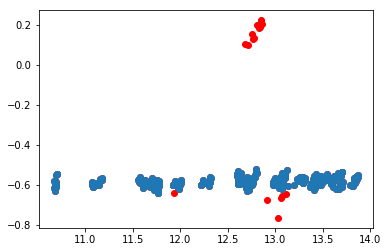

-0.580335616438 0.0203176635697
-0.579164383562 0.0204326583192
There are 38 psf stars.


calibration.py:343: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 3228 but corresponding boolean dimension is 456
  x = obs_num[names == star]


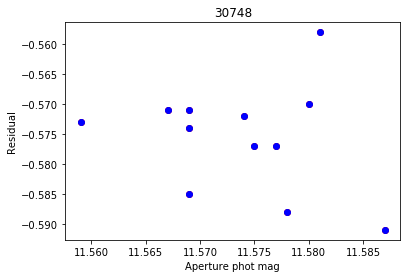

0.014 0.028
0.00484664832642 0.00830421579681


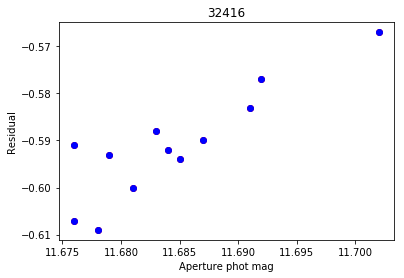

0.016 0.02
0.00529930605156 0.00587753813645


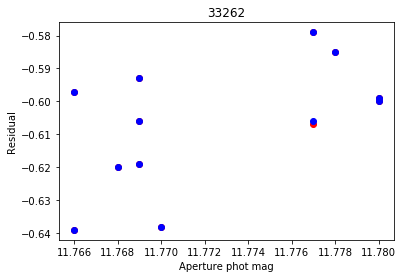

0.014 0.052
0.00525132258473 0.0159208109788


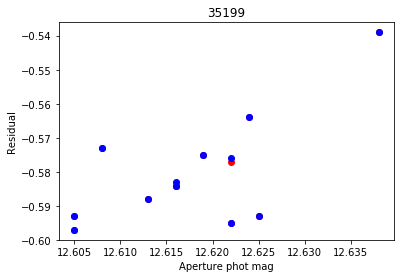

0.02 0.037
0.00701238573661 0.0102980380062


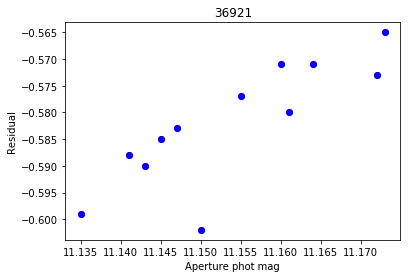

0.038 0.023
0.0117886480235 0.00671854812358


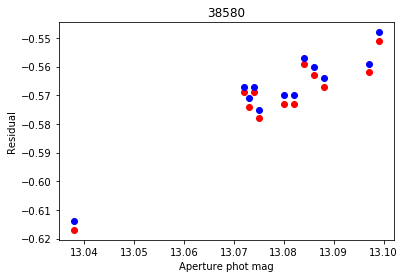

0.027 0.017
0.0088532573265 0.00517782940578


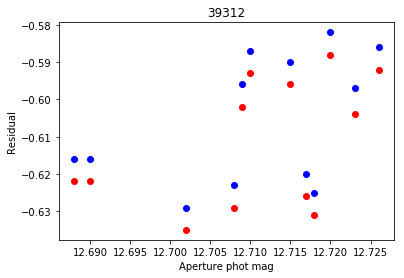

0.024 0.046
0.00708237248385 0.015485799947


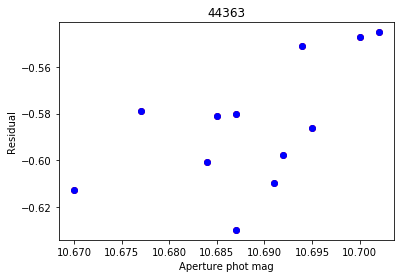

0.018 0.072
0.00583180932473 0.0232645653301


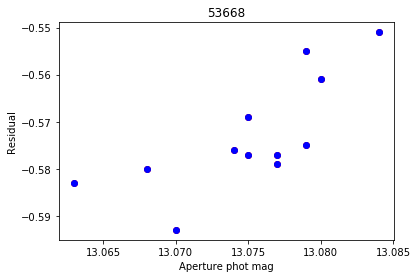

0.014 0.029
0.00363318042492 0.00900055553841


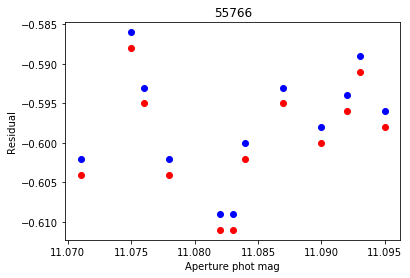

0.024 0.031
0.00744796765717 0.00918747637941


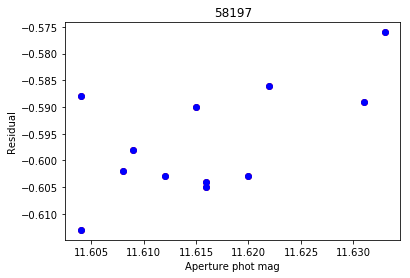

0.029 0.031
0.00905385123703 0.00849632273398


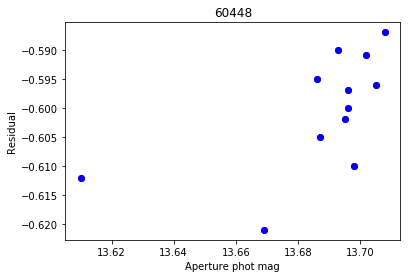

0.022 0.027
0.00672606868832 0.00744916102659


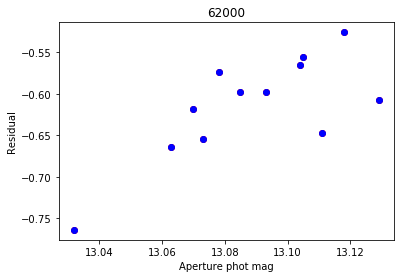

0.066 0.114
0.020504383728 0.035975427794


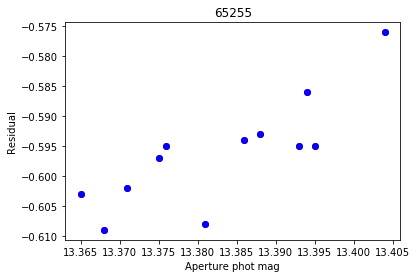

0.039 0.022
0.0117260393996 0.00696967638337


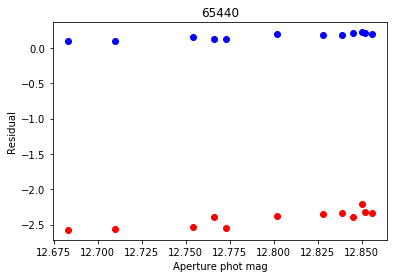

0.028 0.026
0.00930949336251 0.00998331942125


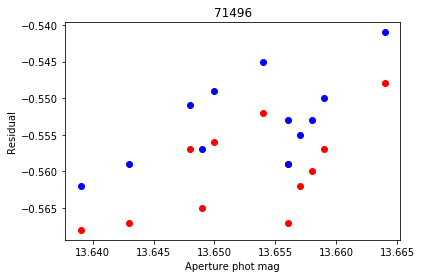

0.016 0.016
0.00472122865364 0.00553534100124


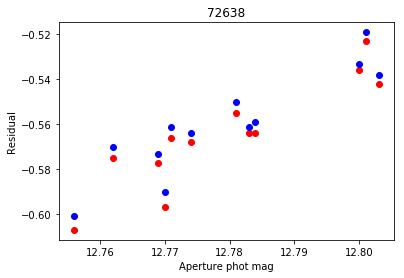

0.047 0.04
0.014807092895 0.010711818499


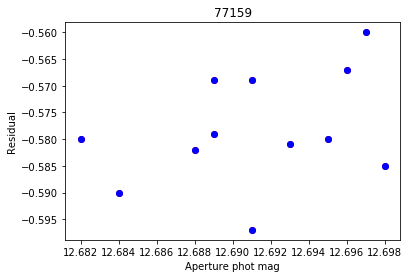

0.016 0.031
0.00480378901378 0.00946337971105


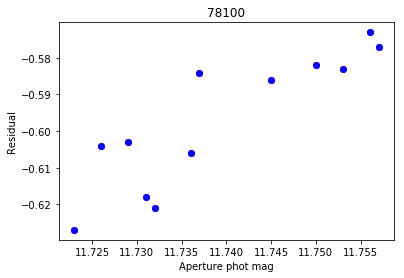

0.034 0.032
0.0115935207 0.00938490217791


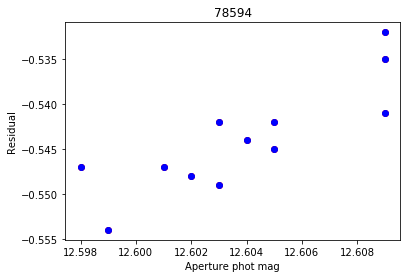

0.011 0.012
0.0035697416651 0.00336959443653


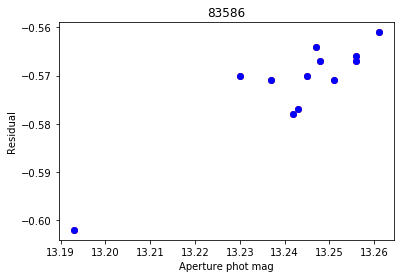

0.031 0.023
0.00857538279511 0.00697812402269


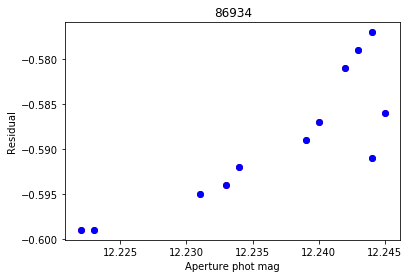

0.006 0.014
0.00206031501455 0.00474234076363


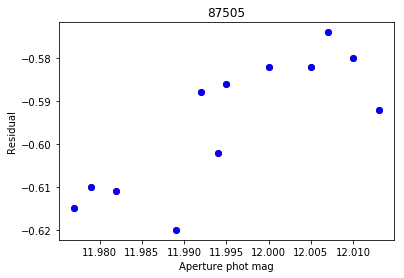

0.036 0.029
0.0115911244781 0.00898571397027


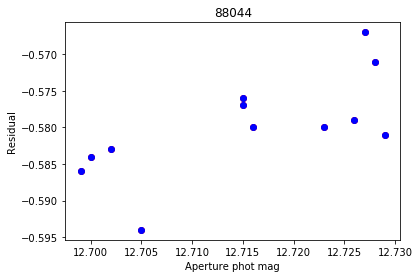

0.03 0.026
0.0109655394557 0.00800130197739


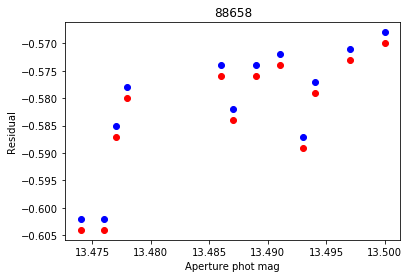

0.026 0.024
0.00839477350631 0.0071394833302


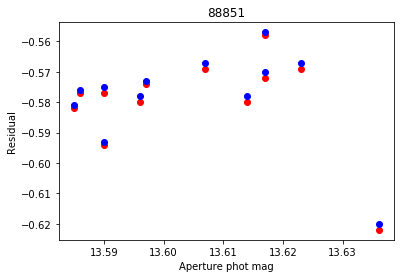

0.038 0.03
0.013328029248 0.00994031776934


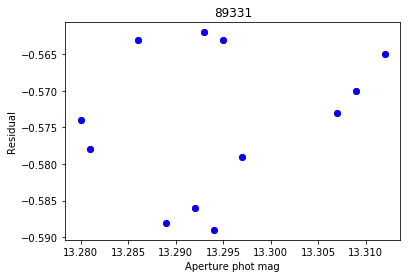

0.032 0.034
0.00992856429142 0.0119591317968


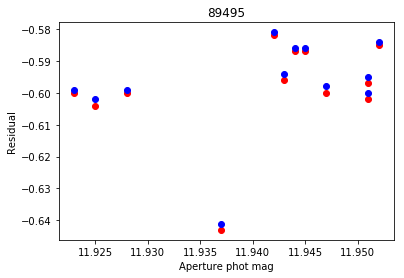

0.015 0.055
0.00468514858718 0.0152347880009


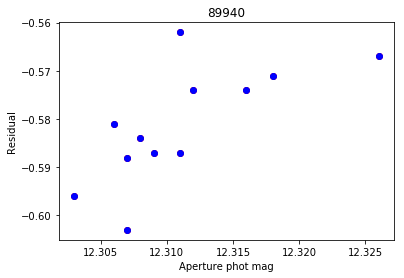

0.009 0.037
0.00269887951144 0.00971189928152


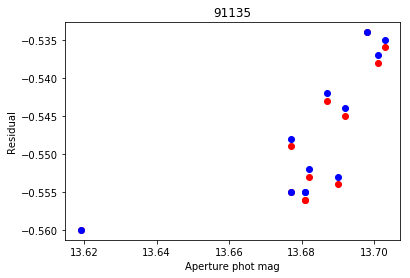

0.026 0.018
0.00899954085146 0.00463903666261


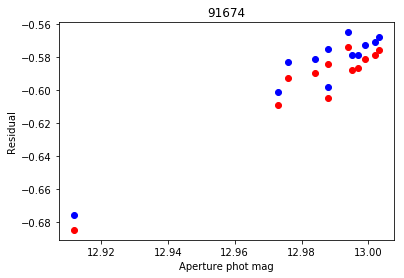

0.019 0.027
0.00623807504339 0.00751295177972


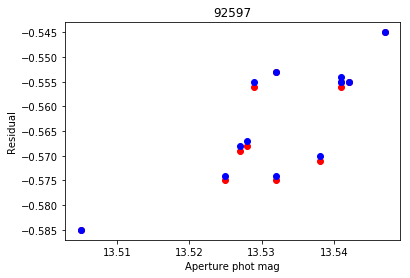

0.017 0.024
0.00611964051232 0.00722495674728


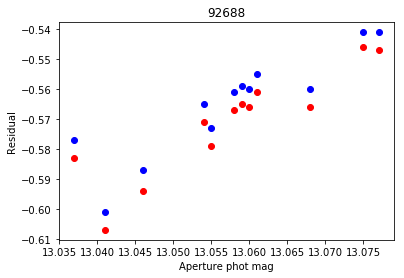

0.04 0.028
0.0117647661355 0.00805665701282


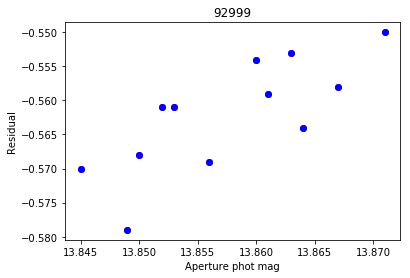

0.026 0.015
0.00764262534881 0.00535607132141


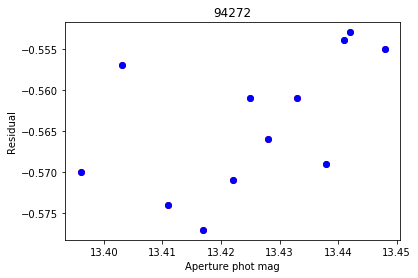

0.052 0.047
0.0155688435309 0.0131550581738


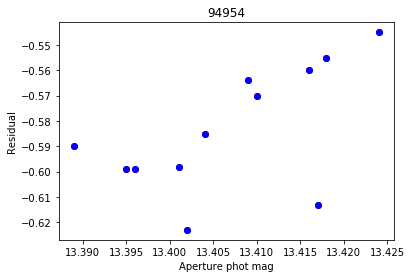

0.035 0.061
0.0102560957484 0.019112968256


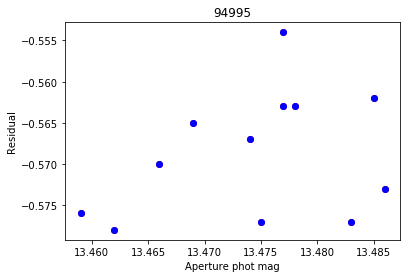

0.02 0.029
0.00616441400297 0.00959635347411


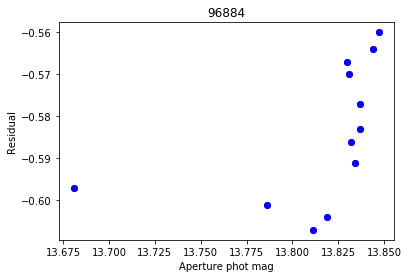

0.028 0.028
0.00773320561836 0.00929887820129


/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/numpy/core/numeric.py:531: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


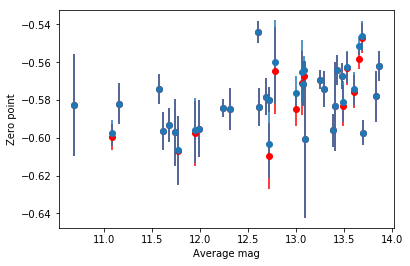

-0.580212376662 0.0155966055568
-0.579030531181 0.0158761828286


In [5]:
I1zp, I1zper = calibration.find_zp_bcds('I1', data_dir=folder, mosaics=1)

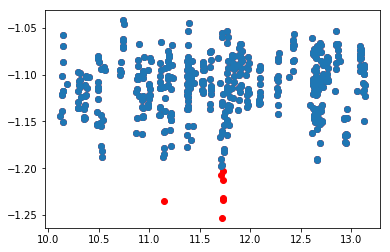

-1.11304904051 0.0322354700105
-1.11109978769 0.0301600933582
There are 40 psf stars.


calibration.py:343: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 3184 but corresponding boolean dimension is 478
  x = obs_num[names == star]


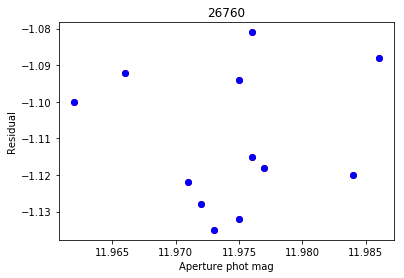

0.005 0.051
0.0016413036133 0.0179988661774


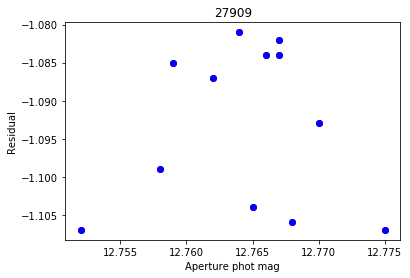

0.017 0.038
0.00461939855124 0.0121233331478


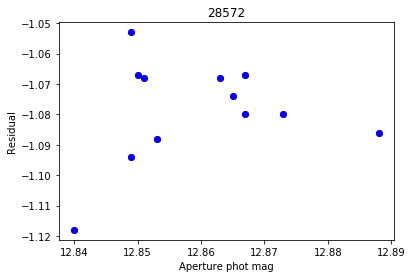

0.027 0.056
0.00890168523371 0.0156169779407


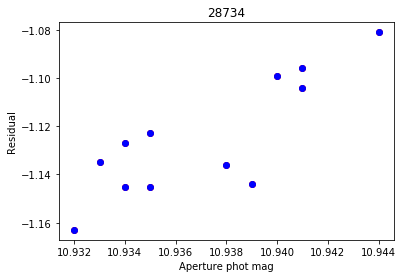

0.009 0.058
0.00317271424848 0.018237188416


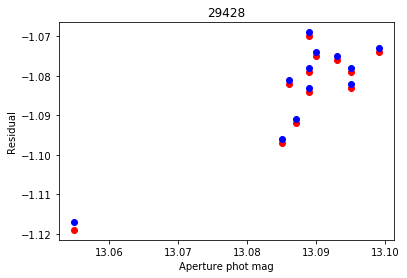

0.01 0.023
0.0033406586177 0.00668206554892


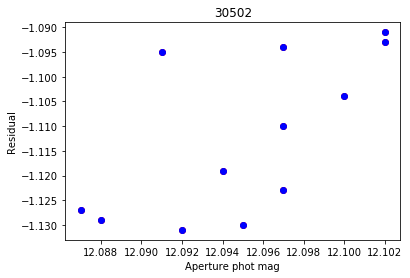

0.015 0.039
0.00477551626063 0.0128409068562


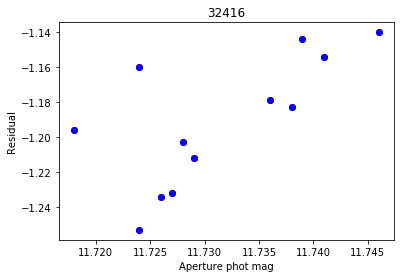

0.023 0.094
0.00705819961592 0.0300858276402


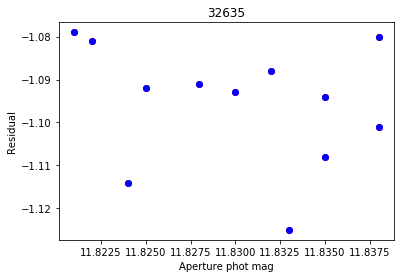

0.017 0.058
0.00578011437795 0.0160127987005


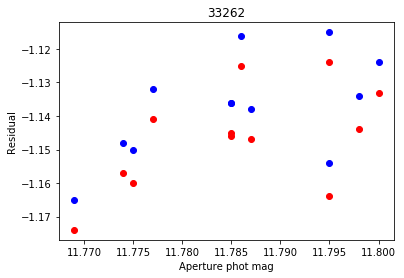

0.031 0.047
0.00973396116697 0.0119082137853


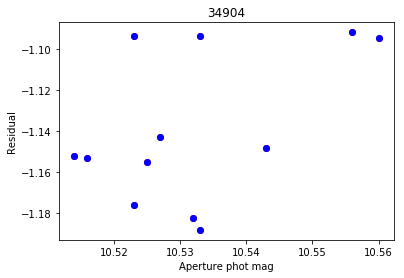

0.019 0.104
0.00659030338948 0.0333866240681


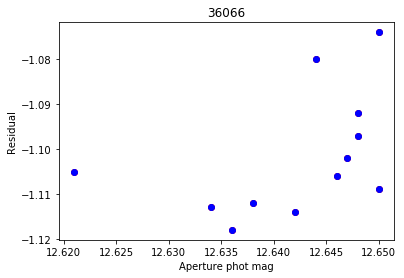

0.006 0.035
0.00198976975388 0.0125291496853


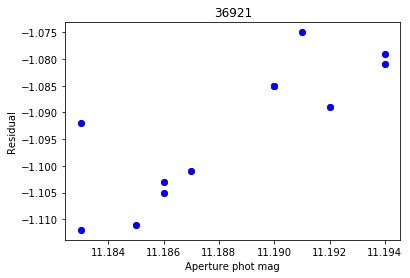

0.011 0.03
0.00377399729141 0.00941150300902


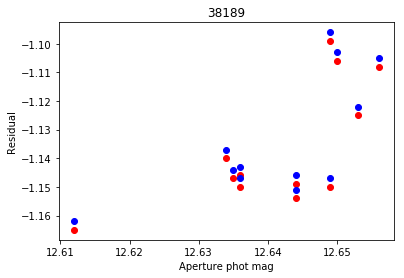

0.022 0.051
0.00750536997838 0.0158333260838


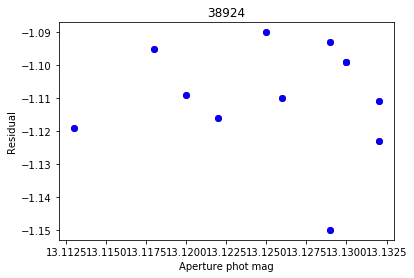

0.007 0.064
0.00236841191519 0.0191833260933


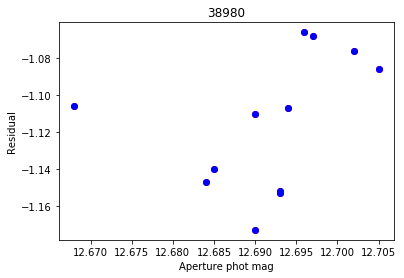

0.021 0.101
0.00611055177338 0.0328774332915


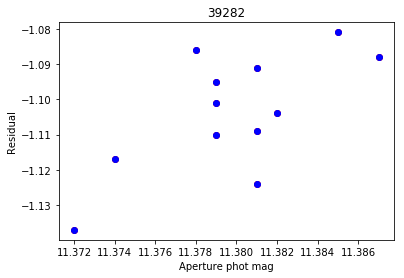

0.007 0.041
0.00200616334281 0.0124275679215


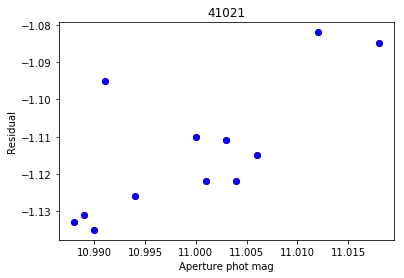

0.03 0.04
0.00917726659862 0.0123656670755


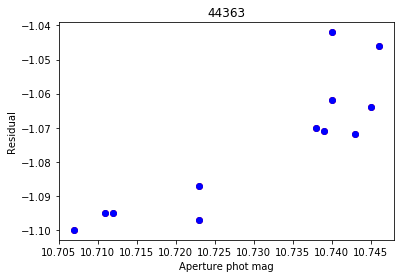

0.005 0.033
0.00167332005307 0.0114821600755


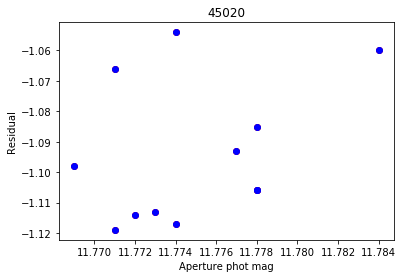

0.009 0.063
0.00308823413663 0.020522110632


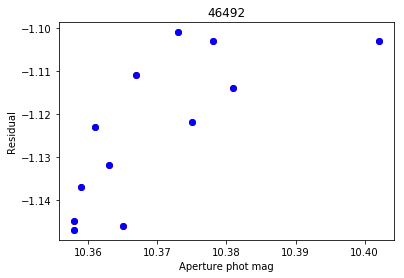

0.009 0.033
0.00328881840949 0.0108496214549


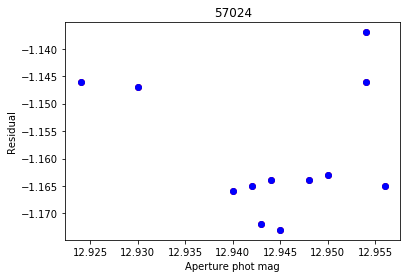

0.016 0.03
0.00537028863284 0.00839583229942


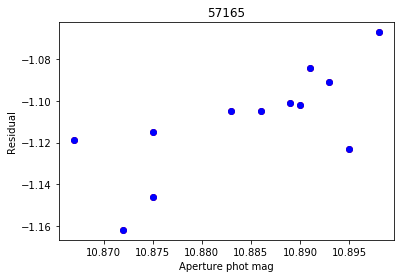

0.023 0.056
0.00743303437366 0.0161876496132


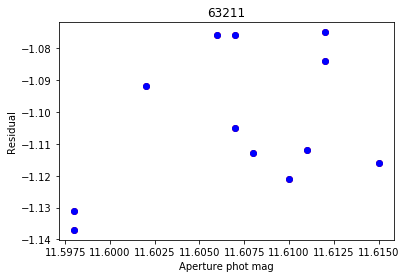

0.017 0.053
0.0052254718022 0.0196948949956


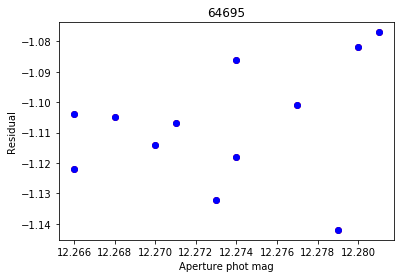

0.015 0.063
0.00501871497497 0.0180005786944


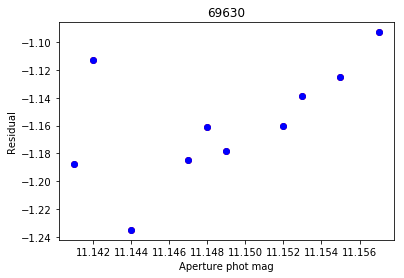

0.016 0.129
0.00517300686255 0.036914089451


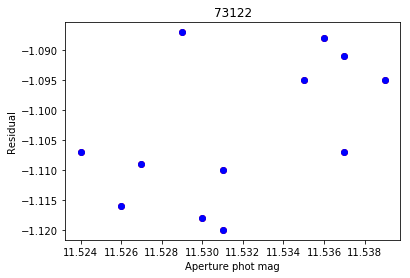

0.015 0.035
0.00468745370348 0.00984427357514


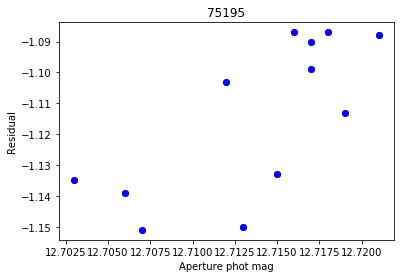

0.009 0.06
0.00267129228448 0.0199610732288


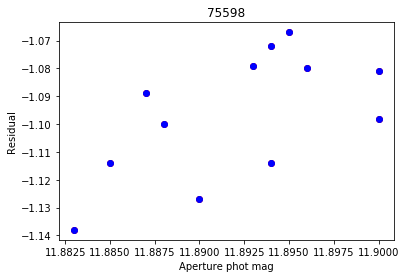

0.017 0.059
0.00529871577733 0.0189267594221


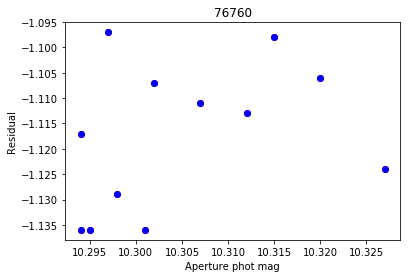

0.008 0.043
0.00301018678653 0.0143270829593


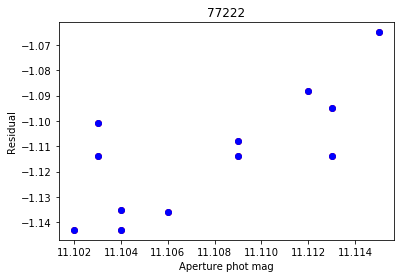

0.013 0.067
0.00445580146176 0.0197236110622


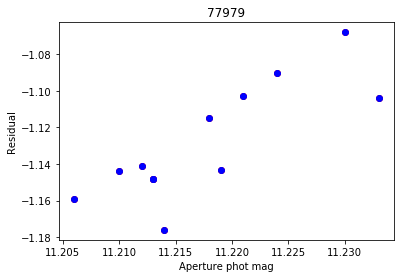

0.015 0.066
0.00442216638714 0.0179161283296


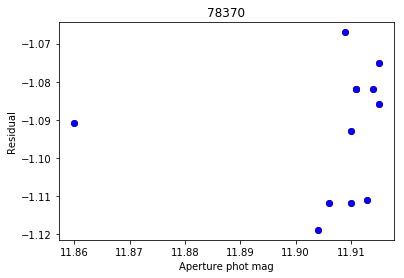

0.009 0.048
0.0027276363394 0.0146914941378


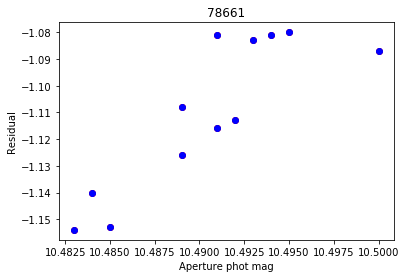

0.017 0.066
0.00469929072662 0.0232211589337


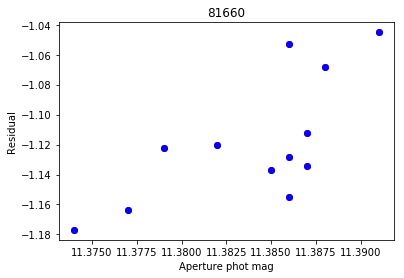

0.003 0.102
0.000903507902905 0.034745723566


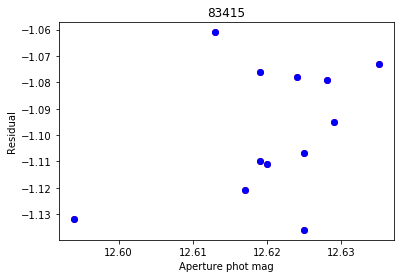

0.022 0.087
0.00596130774937 0.0227879190844


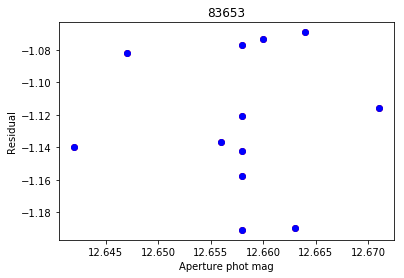

0.004 0.116
0.00106904496765 0.0388618694604


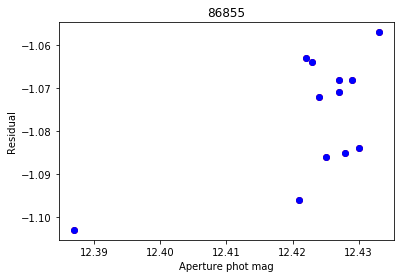

0.012 0.032
0.00349261322042 0.0109635006776


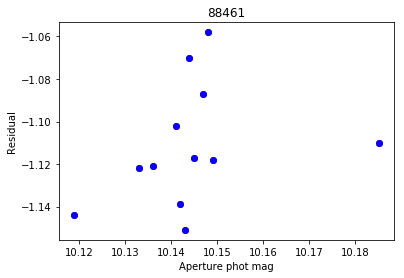

0.008 0.088
0.00271281680178 0.0292977708196


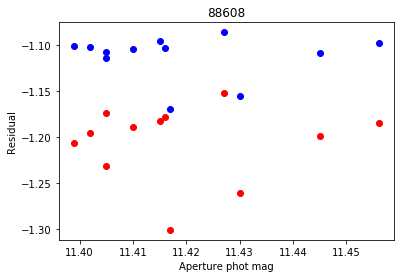

0.031 0.087
0.00983056458196 0.0303712034664


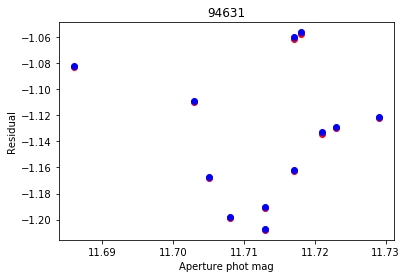

0.026 0.146
0.00746894396598 0.0472139494725


/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/numpy/core/numeric.py:531: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


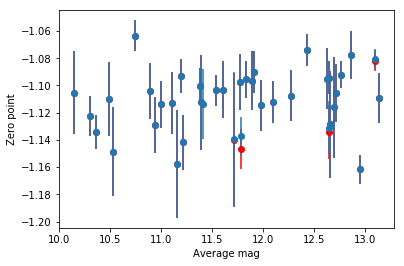

-1.11123495006 0.0225675885845
-1.11093063511 0.0218719103082


In [4]:
I2zp, I2zper = calibration.find_zp_bcds('I2', data_dir=folder, mosaics=1)

In [5]:
calibration.apply_calibration_bcds(target, 'I1', -0.58, data_dir=folder, mosaics=1)
calibration.apply_calibration_bcds(target, 'I2', -1.11, data_dir=folder, mosaics=1)

In [8]:
dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
data = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

lightcurves.make_lcv(['I1', 'I2'], data['star'], data['dao'], data_dir=folder, mosaics=1)

In [9]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables-new.txt', dtype=dtype1, usecols=(0,1,2))

for ind, lcv in enumerate(data['id']):
    lcv_file = folder+'mosaic_lcvs/'+lcv+'.lcv'
    try:
        lightcurves.phase_lcv(lcv_file, data['new_period'][ind], 0, bin=0)
    except:
        print lcv +' not found.'

V2 not found.
V3 not found.
V8 not found.
V9 not found.
V10 not found.
V15 not found.
V19 not found.
V20 not found.
V21 not found.
V29 not found.
V31 not found.
V32 not found.
V43 not found.
V58 not found.
V61 not found.
V62 not found.
V63 not found.
V66 not found.
V67 not found.
V68 not found.
V69 not found.
V70 not found.
V71 not found.
V72 not found.
V73 not found.
V74 not found.
V75 not found.
V76 not found.
V79 not found.
V92 not found.
V99 not found.
V100 not found.
V102 not found.
V113 not found.
V122 not found.
V123 not found.
V132 not found.
V157 not found.
V169 not found.


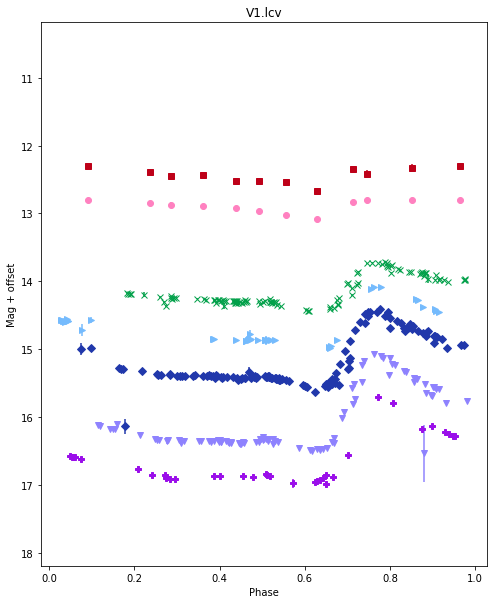

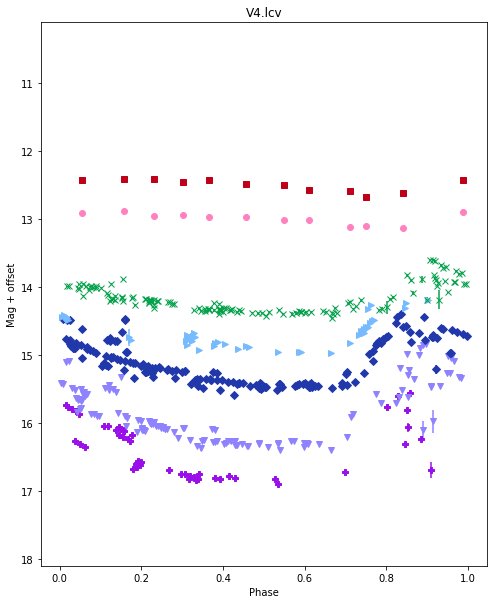

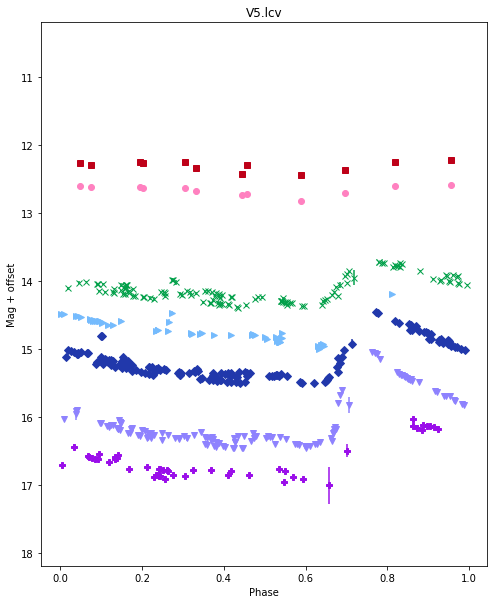

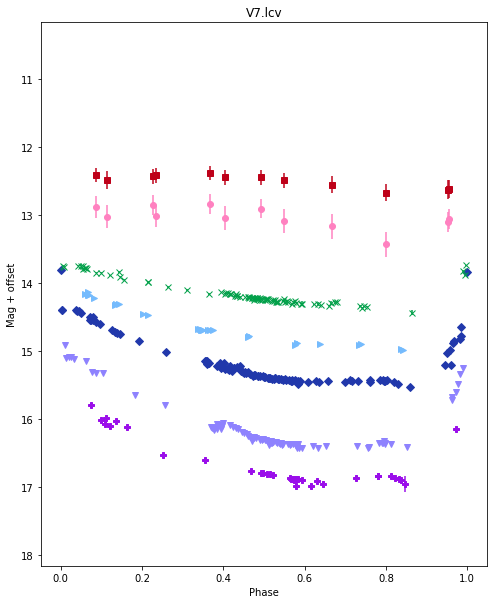

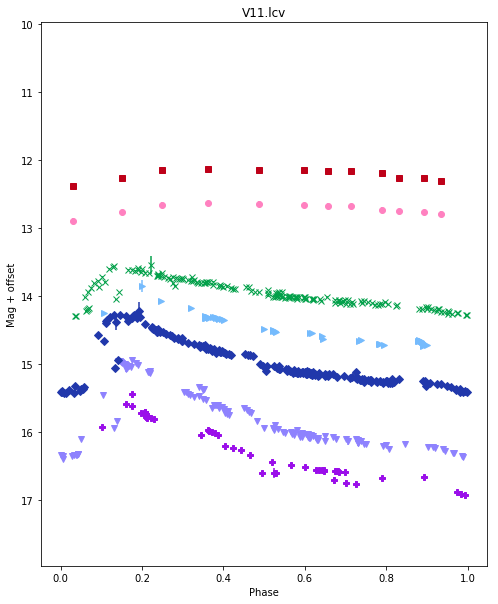

...

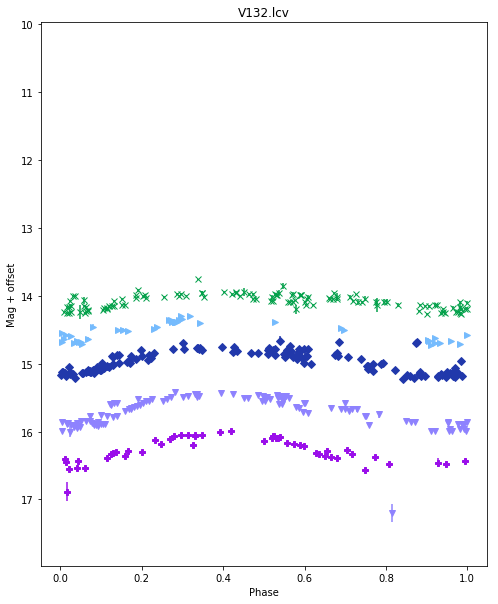

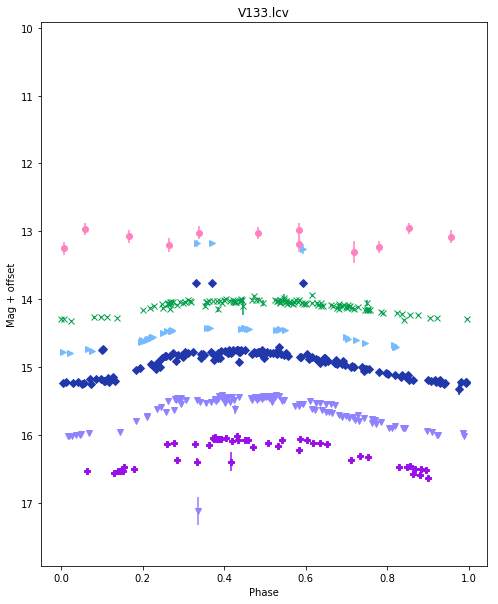

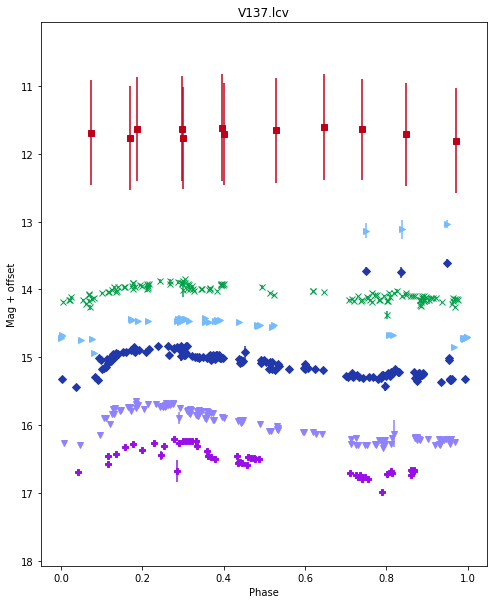

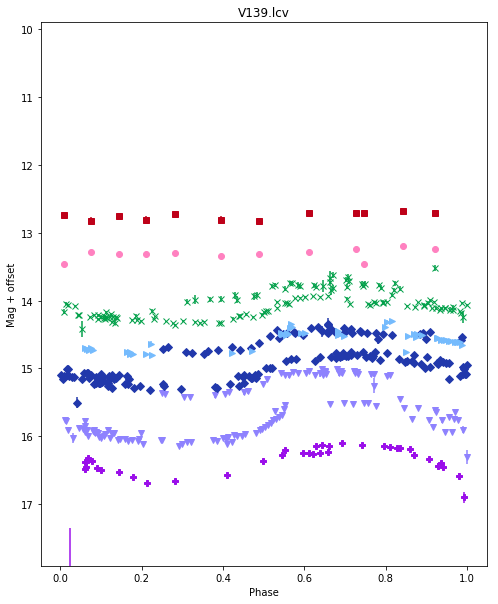

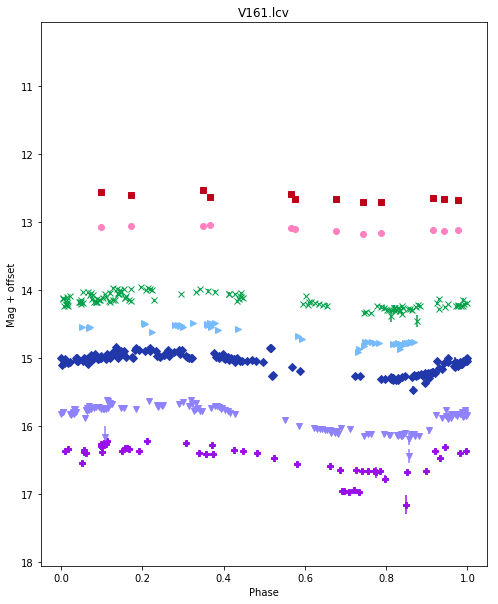

In [4]:
dtype1 = np.dtype([('id', 'S4'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables-new.txt', dtype=dtype1, usecols=(0,1,2))
for ind, star in enumerate(data['id']):
    try:
        if np.isnan(data['new_period'][ind]):
            continue
            #lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['cc_period'][ind], 0, bin_mir=1, data_dir=folder)
        else:
            lightcurves.phase_lcv_all_bands(target, star+'.lcv',data['new_period'][ind], 0, bin_mir=1, data_dir=folder, mosaics=1)
    except:
        print star, ' not found.'
        continue

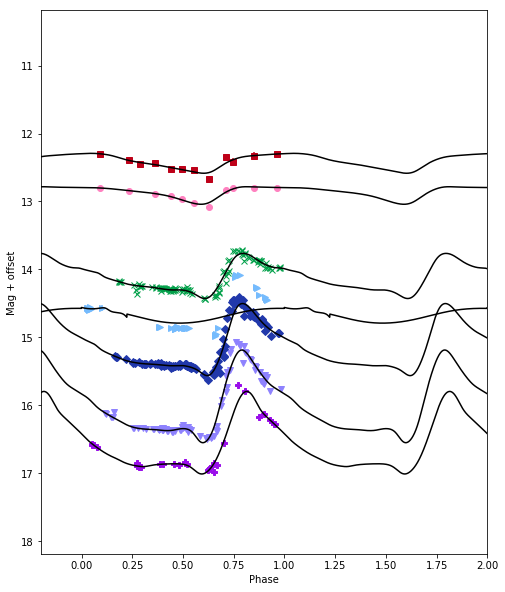

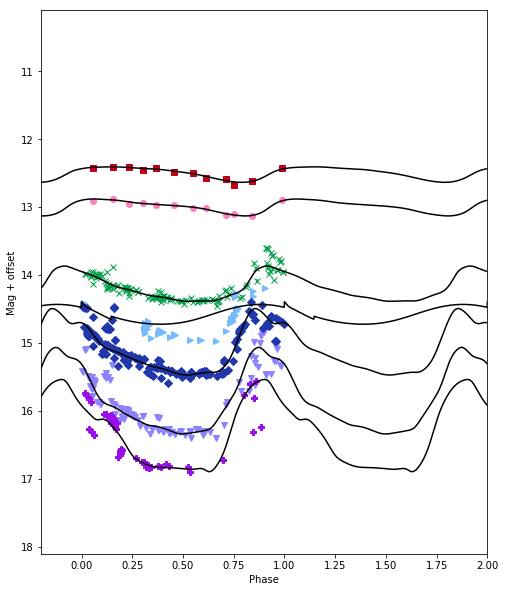

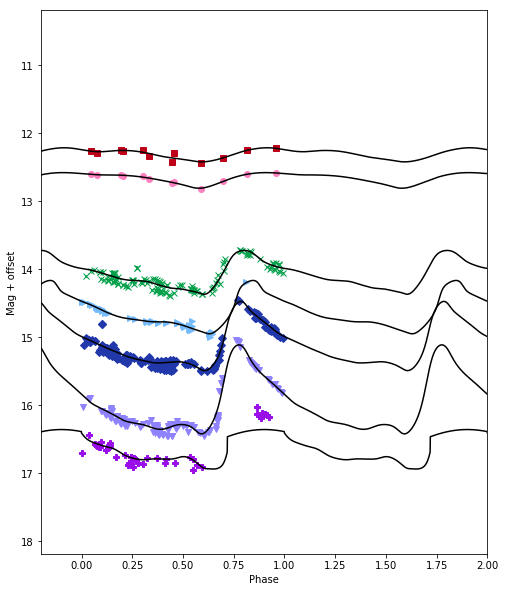

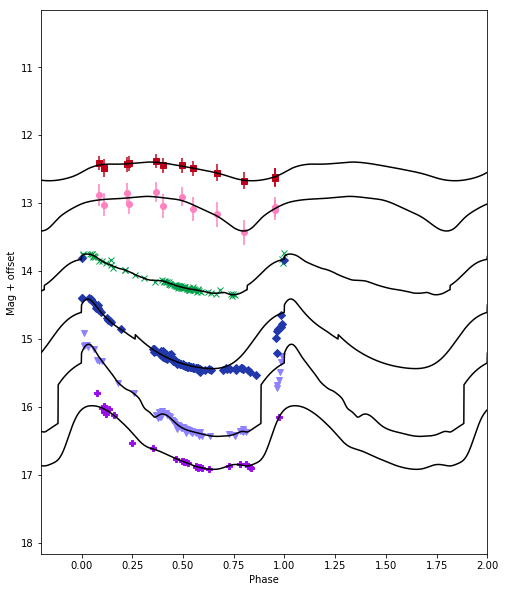

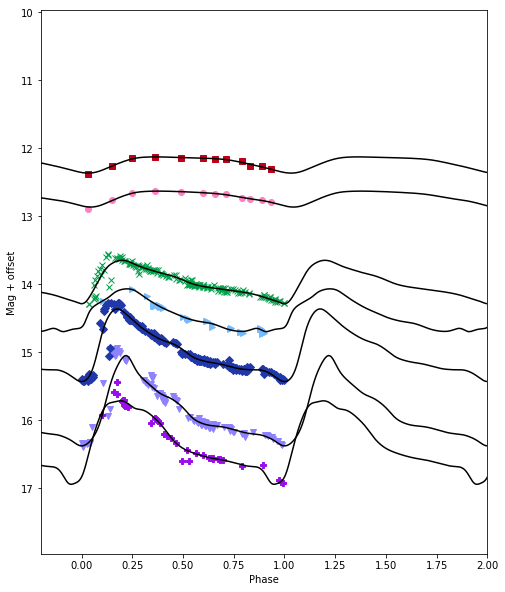

...

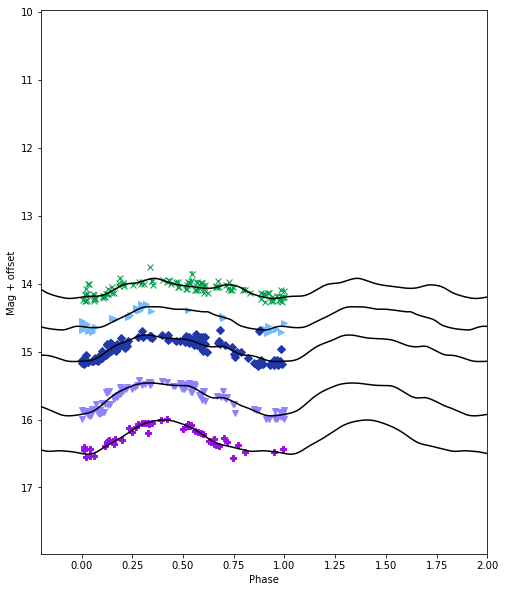

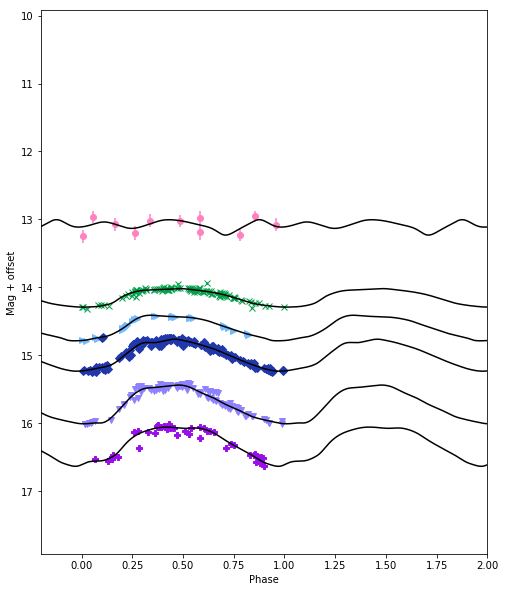

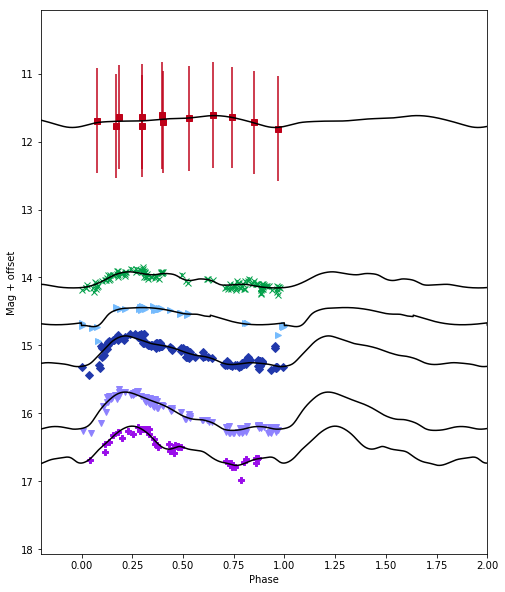

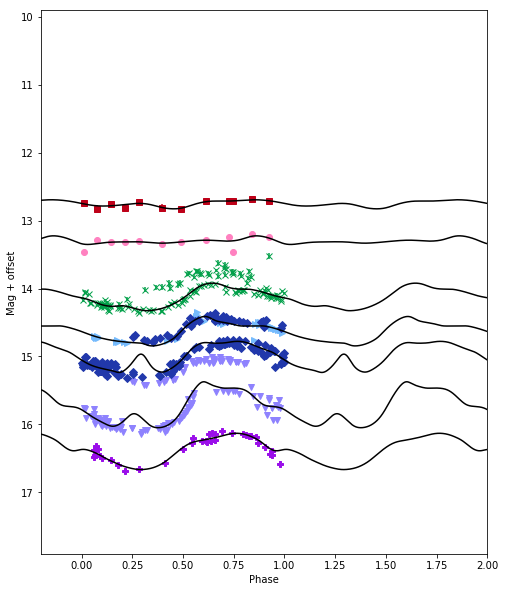

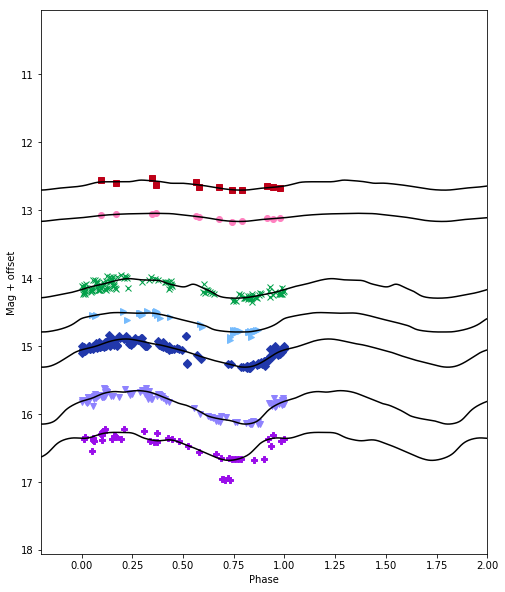

In [5]:
dtype1 = np.dtype([('id', 'S5'), ('cc_period', float), ('new_period', float)])
data = np.loadtxt(folder+target+'-variables-new.txt', dtype=dtype1, usecols=(0,1,2))
f = open(folder+'avg_mags-m.txt', 'w')

for ind, star in enumerate(data['id']):
    try:
        if np.isnan(data['new_period'][ind]) == 1: 
            continue
        filters, avgmag, err, amp, sigma = lightcurves.gloess(folder+'lcvs/'+star+'.mphased', ask=0, master_plot=1, clean=1, mosaics=1)
        datasave = np.array(zip(np.repeat(star, len(filters)),filters, np.repeat(data['new_period'][ind], len(filters)), avgmag, err, amp, sigma), dtype=[('c1', 'S5'), ('c2', 'S2'), ('c3', float), ('c4', float), ('c5', float), ('c6', float), ('c7', float)])
        np.savetxt(f, datasave, fmt='%5s %2s %10.8f %6.3f %6.4f %4.2f %4.2f')
    except:
        print 'Star '+star+' failed.'
        continue
        
f.close()

In [5]:
# Make txt file with all average mags and other info
dtype = np.dtype([('name', 'S10'), ('filter', 'S2'), ('period', float), ('mag', float), ('err', float), 
                 ('amp', float), ('sigma', float)])
avg_mags = np.loadtxt(folder+'avg_mags-m.txt', dtype=dtype)

dtype1 = np.dtype([('id', 'S10'), ('type', 'S6')])
clem = np.loadtxt(folder+target+'-clement.txt', dtype=dtype1, usecols=(0,7))

dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
dao_ids = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

catalog_data = analysis_routines.read_merged_catalog(folder)

f_handle = open(folder+'RRL-avg-mags.txt', 'w')

stars = np.unique(avg_mags['name'])

for star in stars:
    avgs = avg_mags['mag'][avg_mags['name'] == star]
    errs = avg_mags['err'][avg_mags['name'] == star]
    amps = avg_mags['amp'][avg_mags['name'] == star]
    avgs[avgs == 0.0] = 99.999
    errs[errs == 0.0] = 9.999
    amps[amps == 0.0] = 9.99
    period = avg_mags['period'][avg_mags['name'] == star][0]
    vtype = clem['type'][clem['id'] == star]
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    rdist = catalog_data['rad_dist'][catalog_data['id'] == dao_id[0]]
  
    dtype2 = np.dtype([('c1', 'S10'), ('c2', float), ('c3', 'S6'), ('c4', float), ('c5', float), 
                    ('c6', float), ('c7', float), ('c8', float), ('c9', float), ('c10', float),
                    ('c11', float), ('c12', float), ('c13', float), ('c14', float), ('c15', float),
                    ('c16', float), ('c17', float), ('c18', float), ('c19', float), ('c20', float),
                    ('c21', float), ('c22', float), ('c23', float), ('c24', float), ('c25', float),
                    ('c26', float), ('c27', float), ('c28', float), ('c29', float), ('c30', float),
                    ('c31', float), ('c32', float), ('c33', float), ('c34', float)])
    #data = np.array([star, period, vtype[0]], dtype=object)
    data = np.zeros(1, dtype=dtype2)
    data[0][0] = star
    data[0][1] = period
    data[0][2] = vtype[0]
    data[0][3] = rdist[0]
    for ind, a in enumerate(avgs):
        data[0][3*(ind+1)+1] = a
        data[0][3*(ind+1)+2] = errs[ind]
        data[0][3*(ind+1)+3] = amps[ind]
    np.savetxt(f_handle, data, fmt='%10s %.8f %6s %8.2f '+'%6.3f %5.3f %4.2f '*10)

f_handle.close()

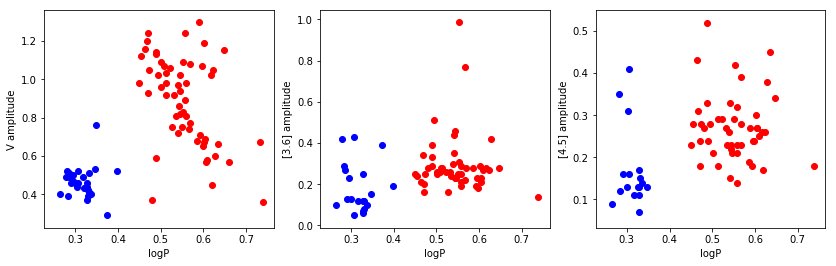

In [3]:
# bailey diagrams  
dtype = np.dtype([('name', 'S10'), ('period', float), ('type', 'S6'), ('dist', float), ('U', float), ('Uer', float), 
                    ('Uamp', float), ('B', float), ('Ber', float), ('Bamp', float), ('V', float),
                    ('Ver', float), ('Vamp', float), ('R', float), ('Rer', float), ('Ramp', float),
                    ('I', float), ('Ier', float), ('Iamp', float), ('J', float), ('Jer', float),
                    ('Jamp', float), ('H', float), ('Her', float), ('Hamp', float), ('K', float),
                    ('Ker', float), ('Kamp', float), ('3.6', float), ('3.6er', float), ('3.6amp', float),
                    ('4.5', float), ('4.5er', float), ('4.5amp', float)])
data = np.loadtxt(folder+'RRL-avg-mags.txt', dtype=dtype)


fig1 = mp.figure(figsize=(14,4))
ax1 = fig1.add_subplot(131)
ax1.scatter(data['period'][data['type'] == 'RR1'], data['Vamp'][data['type'] == 'RR1'], color='b')
ax1.scatter(data['period'][data['type'] == 'RR0'], data['Vamp'][data['type'] == 'RR0'], color='r')
unknownp = data['period'][(data['type'] != 'RR0') & (data['type'] != 'RR1')]
unknownV = data['Vamp'][(data['type'] != 'RR0') & (data['type'] != 'RR1')]
ax1.scatter(unknownp, unknownV, color='g')
ax1.set_xlabel('logP')
ax1.set_ylabel('V amplitude')
#for label, x, y in zip(data['name'], data['period'], data['Vamp']):
#    ax1.annotate(label, xy=(x, y))


rrc_3p6_period = data['period'][data['type'] == 'RR1']
rrab_3p6_period = data['period'][data['type'] == 'RR0'] 
rrc_3p6 = data['3.6amp'][data['type'] == 'RR1']
rrab_3p6 = data['3.6amp'][data['type'] == 'RR0'] 
rrc_4p5_period = data['period'][data['type'] == 'RR1']
rrab_4p5_period = data['period'][data['type'] == 'RR0'] 
rrc_4p5 = data['4.5amp'][data['type'] == 'RR1']
rrab_4p5 = data['4.5amp'][data['type'] == 'RR0'] 

#fig2 = mp.figure(figsize=(14,6))
ax2 = fig1.add_subplot(132)
ax2.scatter(rrc_3p6_period[rrc_3p6 < 9], rrc_3p6[rrc_3p6 < 9], color='b')
ax2.scatter(rrab_3p6_period[rrab_3p6 < 9], rrab_3p6[rrab_3p6 < 9], color='r')
ax2.set_xlabel('logP')
ax2.set_ylabel('[3.6] amplitude')

ax3 = fig1.add_subplot(133)
ax3.scatter(rrc_4p5_period[rrc_4p5 < 9], rrc_4p5[rrc_4p5 < 9], color='b')
ax3.scatter(rrab_4p5_period[rrab_4p5 < 9], rrab_4p5[rrab_4p5 < 9], color='r')
ax3.set_xlabel('logP')
ax3.set_ylabel('[4.5] amplitude')

mp.savefig(folder+target+'-bailey.eps', format='eps')

45303


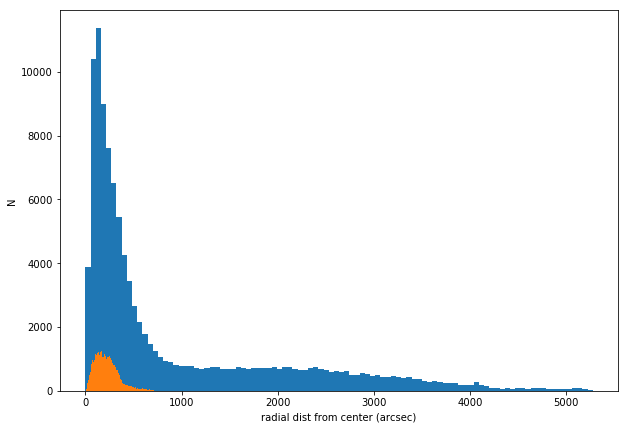

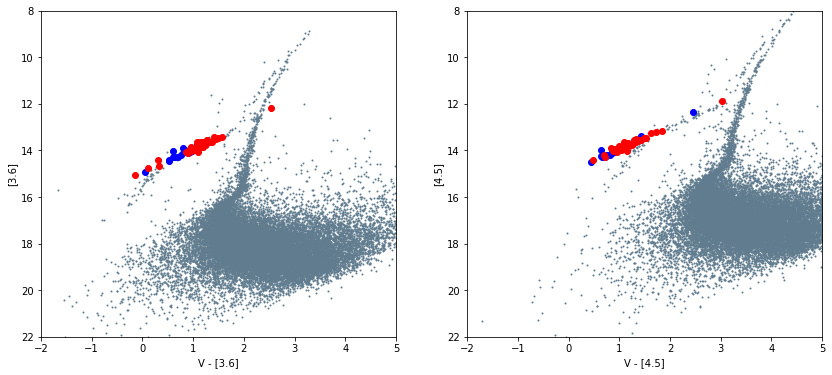

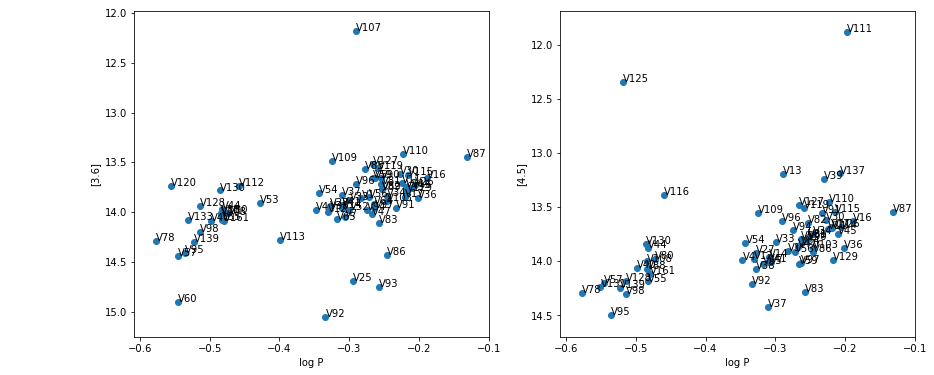

In [3]:
catalog_data = analysis_routines.read_merged_catalog(folder)

# apply extinction
catalog_data['V'] = catalog_data['V'] - Rv*ebv*red_law[0]
catalog_data['3.6'] = catalog_data['3.6'] - Rv*ebv*red_law[1]
catalog_data['4.5'] = catalog_data['4.5'] - Rv*ebv*red_law[2]

thres = 300
thres2 = 150
dist = catalog_data['rad_dist']
color1 = catalog_data['V'][dist > thres2] - catalog_data['3.6'][dist > thres2]
mag = catalog_data['V'][dist > thres2]
mag1 = catalog_data['3.6'][dist > thres2]
err1 = catalog_data['3.6er'][dist > thres2]
color2 = catalog_data['V'][dist > thres2] - catalog_data['4.5'][dist > thres2]
mag2 = catalog_data['4.5'][dist > thres2]
err2 = catalog_data['4.5er'][dist > thres2]

dtype = np.dtype([('name', 'S10'), ('period', float), ('type', 'S6'), ('dist', float), ('U', float), ('Uer', float), 
                    ('Uamp', float), ('B', float), ('Ber', float), ('Bamp', float), ('V', float),
                    ('Ver', float), ('Vamp', float), ('R', float), ('Rer', float), ('Ramp', float),
                    ('I', float), ('Ier', float), ('Iamp', float), ('J', float), ('Jer', float),
                    ('Jamp', float), ('H', float), ('Her', float), ('Hamp', float), ('K', float),
                    ('Ker', float), ('Kamp', float), ('3.6', float), ('3.6er', float), ('3.6amp', float),
                    ('4.5', float), ('4.5er', float), ('4.5amp', float)])
data = np.loadtxt(folder+'RRL-avg-mags.txt', dtype=dtype)

# apply extinction
data['V'] = data['V'] - Rv*ebv*red_law[0]
data['3.6'] = data['3.6'] - Rv*ebv*red_law[1]
data['4.5'] = data['4.5'] - Rv*ebv*red_law[2]

print len(dist[(catalog_data['3.6'] < 90) | (catalog_data['4.5'] < 90)])


histfig = mp.figure(figsize=(10,7))
ax1 = histfig.add_subplot(111)
ax1.hist(dist, bins='auto')  
n, bins, patches = ax1.hist(dist[catalog_data['3.6'] < 90], bins='auto')
#print bins[np.argmax(n)/3]
#ax1.plot([bins[np.argmax(n)/3], bins[np.argmax(n)/3]], [0,3500])
ax1.set_xlabel('radial dist from center (arcsec)')
ax1.set_ylabel('N')

# CMD 

#cm = mp.cm.get_cmap('RdYlBu')  

fig1 = mp.figure(figsize=(14,6))
ax1 = fig1.add_subplot(121)
ax1.scatter(color1, mag1, s=1, edgecolor=None, color='xkcd:blue grey')
ax1.set_ylim((22,8))
ax1.set_xlim((-2,5))
ax1.set_xlabel('V - [3.6]')
ax1.set_ylabel('[3.6]') 
rrc = data['type'] == 'RR1'
rrab = data['type'] == 'RR0'
rrcab = data['type'] == 'RR01'
ax1.scatter(data['V'][rrc] - data['3.6'][rrc], data['3.6'][rrc], color='b') 
ax1.scatter(data['V'][rrab] - data['3.6'][rrab], data['3.6'][rrab], color='r')
ax1.scatter(data['V'][rrcab] - data['3.6'][rrcab], data['3.6'][rrcab], color='g')
#for label, x, y in zip(data['name'], data['V'] - data['3.6'], data['3.6']):
#    if y < 90.: ax2.annotate(label, xy=(x, y))
    
ax2 = fig1.add_subplot(122)
ax2.scatter(color2, mag2, s=1, edgecolor=None, color='xkcd:blue grey')
ax2.set_ylim((22,8))
ax2.set_xlim((-2,5))
ax2.set_xlabel('V - [4.5]')
ax2.set_ylabel('[4.5]') 
rrc = data['type'] == 'RR1'
rrab = data['type'] == 'RR0'
rrcab = data['type'] == 'RR01'
ax2.scatter(data['V'][rrc] - data['4.5'][rrc], data['4.5'][rrc], color='b') 
ax2.scatter(data['V'][rrab] - data['4.5'][rrab], data['4.5'][rrab], color='r')
ax2.scatter(data['V'][rrcab] - data['4.5'][rrcab], data['4.5'][rrcab], color='g')
#for label, x, y in zip(data['name'], data['V'] - data['4.5'], data['4.5']):
#    if y < 90.: ax2.annotate(label, xy=(x, y))
mp.savefig(folder+target+'-cmd.eps', format='eps')

fig2 = mp.figure(figsize=(14,6))
ax1 = fig2.add_subplot(121)
ax1.scatter(np.log10(data['period']), data['3.6']) 
ax1.set_ylim((np.max(data['3.6'][data['3.6'] < 90])+0.2, np.min(data['3.6'][data['3.6'] < 90])-0.2))
ax1.set_xlabel('log P')
ax1.set_ylabel('[3.6]')
for label, x, y in zip(data['name'], np.log10(data['period']), data['3.6']):
    ax1.annotate(label, xy=(x, y))

ax2 = fig2.add_subplot(122)
ax2.scatter(np.log10(data['period']), data['4.5']) 
ax2.set_ylim((np.max(data['4.5'][data['4.5'] < 90])+0.2, np.min(data['4.5'][data['4.5'] < 90])-0.2))
ax2.set_xlabel('log P')
ax2.set_ylabel('[4.5]')
for label, x, y in zip(data['name'], np.log10(data['period']), data['4.5']):
    ax2.annotate(label, xy=(x, y))

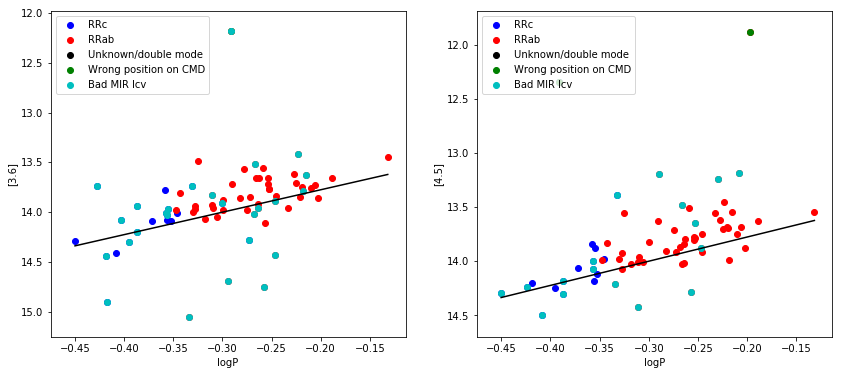

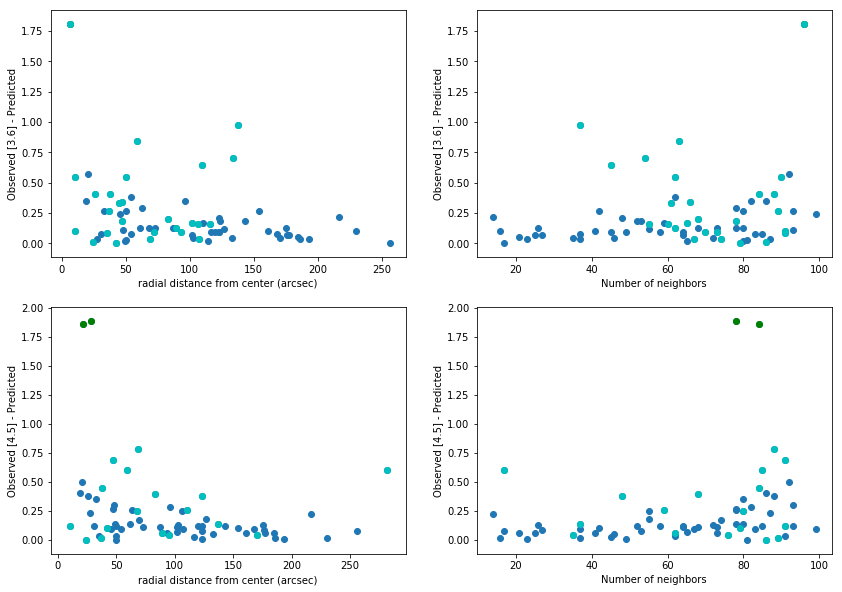

In [5]:
dtype1 = np.dtype([('star', 'S10'), ('dao', int)])
dao_ids = np.loadtxt(folder+'PeterIDs.txt', dtype=dtype1, usecols=(0,1))

mag1 = data['3.6'][~np.isnan(data['period'])]
mag2 = data['4.5'][~np.isnan(data['period'])]
err1 = data['3.6er'][~np.isnan(data['period'])]
err2 = data['4.5er'][~np.isnan(data['period'])]
id1 = data['name'][~np.isnan(data['period'])]
id2 = data['name'][~np.isnan(data['period'])]
mode1 = data['type'][~np.isnan(data['period'])]
mode2 = data['type'][~np.isnan(data['period'])]
logP1 = np.log10(data['period'][~np.isnan(data['period'])])
logP2 = np.log10(data['period'][~np.isnan(data['period'])])
dist1 = data['dist'][~np.isnan(data['period'])]
dist2 = data['dist'][~np.isnan(data['period'])]

cat_ra, cat_dec = coordinates.hms2deg(catalog_data['ra_h'], catalog_data['ra_m'], 
                                      catalog_data['ra_s'], catalog_data['dec_d'], 
                                      catalog_data['dec_m'], catalog_data['dec_s'])
# calculate the number of stars within 8 pixels of each RRL
N_neigh1 = np.zeros(len(id1))
for ind, star in enumerate(id1):
    # find neighbors
    # need to find coordinates of the RRL 
    dao_id = dao_ids['dao'][dao_ids['star'] == star]
    RRL_ra = cat_ra[catalog_data['id'] == dao_id[0]]
    RRL_dec = cat_dec[catalog_data['id'] == dao_id[0]]
    d = coordinates.radial_dist(RRL_ra, RRL_dec, cat_ra, cat_dec)
    N_neigh1[ind] = len(d[d < 8.0])
N_neigh2 = np.copy(N_neigh1)

# Get rid of stars with no data
err1 = err1[mag1 < 90]
id1 = id1[mag1 < 90]
mode1 = mode1[mag1 < 90]
logP1 = logP1[mag1 < 90]
dist1 = dist1[mag1 < 90]
N_neigh1 = N_neigh1[mag1 < 90]
mag1 = mag1[mag1 < 90]
err2 = err2[mag2 < 90]
id2 = id2[mag2 < 90]
mode2 = mode2[mag2 < 90]
logP2 = logP2[mag2 < 90]
dist2 = dist2[mag2 < 90]
N_neigh2 = N_neigh2[mag2 < 90]
mag2 = mag2[mag2 < 90]

fun_logP1 = np.copy(logP1)
fun_logP2 = np.copy(logP2)
fun_logP1[mode1 == 'RR1'] += 0.127
fun_logP2[mode2 == 'RR1'] += 0.127

# Double mode RRL
double1 = id1[(mode1 != 'RR0') & (mode1 != 'RR1')]
double2 = id2[(mode2 != 'RR0') & (mode2 != 'RR1')]
mask_double1 = np.in1d(id1, double1)
mask_double2 = np.in1d(id2, double2)

# Stars in the wrong place on the CMD
bad_cmd1 = ['V107']
bad_cmd2 = ['V125', 'V111']
mask_cmd1 = np.in1d(id1, bad_cmd1)
mask_cmd2 = np.in1d(id2, bad_cmd2)

# Other stars with bad MIR lcvs
#bad_lcv2 = 
bad_lcv1 = ['V103', 'V107', 'V108', 'V110', 'V112', 'V113', 'V115', 'V120', 'V127', 'V128', 'V129', 
          'V133', 'V139', 'V25', 'V37', 'V44', 'V47', 'V53', 'V57', 'V60', 'V86', 'V88', 'V92', 'V93', 'V97', 'V98']
bad_lcv2 = ['V103', 'V108', 'V116', 'V127', 'V128', 'V13', 'V131', 'V137', 'V25', 'V37', 'V39', 'V78', 
           'V82', 'V83', 'V88', 'V92', 'V95', 'V98']
mask_lcv1 = np.in1d(id1, bad_lcv1)
mask_lcv2 = np.in1d(id2, bad_lcv2)


# Theoretical relation
fun_x1 = np.array([np.min(fun_logP1), np.max(fun_logP1)])
fun_x2 = np.array([np.min(fun_logP2), np.max(fun_logP2)])

plz1 = -2.251*fun_logP1 + 0.180*feh - 0.793 + mu
plz2 = -2.239*fun_logP2 + 0.185*feh - 0.785 + mu
plz_line1 = -2.251*fun_x1 + 0.180*feh - 0.793 + mu
plz_line2 = -2.239*fun_x2 + 0.185*feh - 0.785 + mu

# Plot PL relations with theoretical PLZ line
fig1 = mp.figure(figsize=(14,6))
ax1 = fig1.add_subplot(121)
ax1.scatter(fun_logP1[mode1 == 'RR1'], mag1[mode1 == 'RR1'], color='b', label='RRc')
ax1.scatter(fun_logP1[mode1 == 'RR0'], mag1[mode1 == 'RR0'], color='r', label='RRab')
ax1.scatter(fun_logP1[mask_double1], mag1[mask_double1], color='k', label='Unknown/double mode')
ax1.scatter(fun_logP1[mask_cmd1], mag1[mask_cmd1], color='g', label='Wrong position on CMD')
ax1.scatter(fun_logP1[mask_lcv1], mag1[mask_lcv1], color='c', label='Bad MIR lcv')
ax1.plot(fun_x1, plz_line1, 'k-')
ax1.set_ylim(np.max(mag1)+0.2, np.min(mag1)-0.2)
ax1.set_xlabel('logP')
ax1.set_ylabel('[3.6]')
ax1.legend(loc='upper left')
#for label, x, y in zip(id1, fun_logP1, mag1):
#    ax1.annotate(label, xy=(x, y))
    
ax2 = fig1.add_subplot(122)
ax2.scatter(fun_logP2[mode2 == 'RR1'], mag2[mode2 == 'RR1'], color='b', label='RRc')
ax2.scatter(fun_logP2[mode2 == 'RR0'], mag2[mode2 == 'RR0'], color='r', label='RRab')
ax2.scatter(fun_logP2[mask_double2], mag2[mask_double2], color='k', label='Unknown/double mode')
ax2.scatter(fun_logP2[mask_cmd2], mag2[mask_cmd2], color='g', label='Wrong position on CMD')
ax2.scatter(fun_logP2[mask_lcv2], mag2[mask_lcv2], color='c', label='Bad MIR lcv')
ax2.plot(fun_x2, plz_line2, 'k-')
ax2.set_ylim(np.max(mag2)+0.2, np.min(mag2)-0.2)
ax2.set_xlabel('logP')
ax2.set_ylabel('[4.5]')
ax2.legend(loc='upper left')
mp.savefig(folder+target+'-pl-raw.eps', format='eps')
residuals1 = np.abs(mag1 - plz1)
residuals2 = np.abs(mag2 - plz2)

# plot residuals from PLZ vs radial dist and number of neighbors
fig2 = mp.figure(figsize=(14,10))
ax1 = fig2.add_subplot(221)
ax1.scatter(dist1, residuals1)
ax1.scatter(dist1[mask_double1], residuals1[mask_double1], color='k', label='Unknown/double mode')
ax1.scatter(dist1[mask_cmd1], residuals1[mask_cmd1], color='g', label='Wrong position on CMD')
ax1.scatter(dist1[mask_lcv1], residuals1[mask_lcv1], color='c', label='Bad MIR lcv')
ax1.set_xlabel('radial distance from center (arcsec)')
ax1.set_ylabel('Observed [3.6] - Predicted')
ax2 = fig2.add_subplot(222)
ax2.scatter(N_neigh1, residuals1)
ax2.scatter(N_neigh1[mask_double1], residuals1[mask_double1], color='k', label='Unknown/double mode')
ax2.scatter(N_neigh1[mask_cmd1], residuals1[mask_cmd1], color='g', label='Wrong position on CMD')
ax2.scatter(N_neigh1[mask_lcv1], residuals1[mask_lcv1], color='c', label='Bad MIR lcv')
ax2.set_xlabel('Number of neighbors')
ax2.set_ylabel('Observed [3.6] - Predicted')
ax3 = fig2.add_subplot(223)
ax3.scatter(dist2, residuals2)
ax3.scatter(dist2[mask_double2], residuals2[mask_double2], color='k', label='Unknown/double mode')
ax3.scatter(dist2[mask_cmd2], residuals2[mask_cmd2], color='g', label='Wrong position on CMD')
ax3.scatter(dist2[mask_lcv2], residuals2[mask_lcv2], color='c', label='Bad MIR lcv')
ax3.set_xlabel('radial distance from center (arcsec)')
ax3.set_ylabel('Observed [4.5] - Predicted')
ax4 = fig2.add_subplot(224)
ax4.scatter(N_neigh2, residuals2)
ax4.scatter(N_neigh2[mask_double2], residuals2[mask_double2], color='k', label='Unknown/double mode')
ax4.scatter(N_neigh2[mask_cmd2], residuals2[mask_cmd2], color='g', label='Wrong position on CMD')
ax4.scatter(N_neigh2[mask_lcv2], residuals2[mask_lcv2], color='c', label='Bad MIR lcv')
ax4.set_xlabel('Number of neighbors')
ax4.set_ylabel('Observed [4.5] - Predicted')

Using the following stars in [3.6]: 
['V1' 'V11' 'V114' 'V12' 'V130' 'V14' 'V16' 'V161' 'V17' 'V26' 'V27' 'V30'
 'V33' 'V34' 'V36' 'V38' 'V4' 'V40' 'V41' 'V45' 'V5' 'V52' 'V54' 'V55'
 'V56' 'V59' 'V64' 'V65' 'V7' 'V78' 'V80' 'V81' 'V82' 'V83' 'V85' 'V87'
 'V89' 'V90' 'V91' 'V95' 'V96']
Using the following stars in [4.5]: 
['V1' 'V11' 'V114' 'V115' 'V12' 'V129' 'V130' 'V139' 'V14' 'V16' 'V161'
 'V17' 'V26' 'V27' 'V30' 'V33' 'V34' 'V36' 'V38' 'V4' 'V40' 'V41' 'V44'
 'V45' 'V47' 'V5' 'V54' 'V55' 'V56' 'V57' 'V59' 'V64' 'V65' 'V7' 'V80'
 'V81' 'V86' 'V87' 'V89' 'V90' 'V91' 'V96' 'V97']
[3.6] RRc fit: -3.839 (+- 1.616) logP + 12.169 (+- 0.817) 
      dispersion: 0.082
[3.6] RRab fit: -1.688 (+- 0.510) logP + 13.359 (+- 0.138) 
      dispersion: 0.092


/Users/Jill/anaconda2/envs/astroconda/lib/python2.7/site-packages/numpy/core/numeric.py:531: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


[4.5] RRc fit: -3.574 (+- 1.976) logP + 12.290 (+- 0.982) 
      dispersion: 0.066
[4.5] RRab fit: -1.973 (+- 0.483) logP + 13.279 (+- 0.129) 
      dispersion: 0.094
[3.6] FUN fit: -2.235 (+- 0.368) logP + 13.221 (+- 0.107) 
      dispersion: 0.100
[4.5] FUN fit: -2.250 (+- 0.342) logP + 13.211 (+- 0.098) 
      dispersion: 0.093



Cutting central 28 arcsec: 

[3.6] RRc fit: -3.839 (+- 1.616) logP + 12.169 (+- 0.817) 
      dispersion: 0.082
[3.6] RRab fit: -1.969 (+- 0.436) logP + 13.300 (+- 0.118) 
      dispersion: 0.079
[4.5] RRc fit: -3.574 (+- 1.976) logP + 12.290 (+- 0.982) 
      dispersion: 0.066
[4.5] RRab fit: -2.143 (+- 0.398) logP + 13.264 (+- 0.106) 
      dispersion: 0.074
[3.6] FUN fit: -2.323 (+- 0.317) logP + 13.210 (+- 0.092) 
      dispersion: 0.085
[4.5] FUN fit: -2.217 (+- 0.286) logP + 13.245 (+- 0.082) 
      dispersion: 0.073


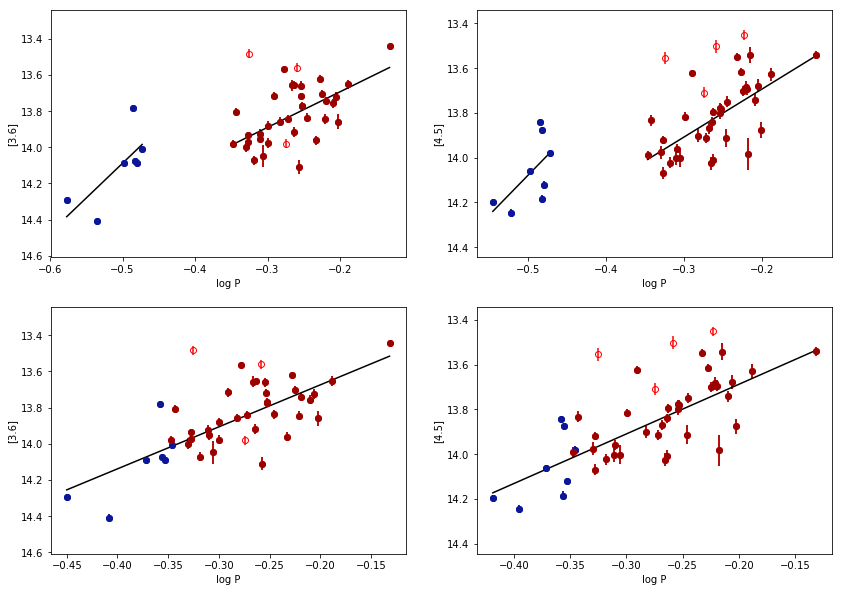

In [6]:
m_id1 = ma.array(id1)
m_logP1 = ma.array(logP1)
m_mag1 = ma.array(mag1)
m_err1 = ma.array(err1)
m_funP1 = ma.array(fun_logP1)
m_id1[mask_double1] = ma.masked
m_id1[mask_cmd1] = ma.masked
m_id1[mask_lcv1] = ma.masked
m_logP1[mask_double1] = ma.masked
m_logP1[mask_cmd1] = ma.masked
m_logP1[mask_lcv1] = ma.masked
m_mag1[mask_double1] = ma.masked
m_mag1[mask_cmd1] = ma.masked
m_mag1[mask_lcv1] = ma.masked
m_err1[mask_double1] = ma.masked
m_err1[mask_cmd1] = ma.masked
m_err1[mask_lcv1] = ma.masked
m_funP1[mask_double1] = ma.masked
m_funP1[mask_cmd1] = ma.masked
m_funP1[mask_lcv1] = ma.masked

m_id2 = ma.array(id2)
m_logP2 = ma.array(logP2)
m_mag2 = ma.array(mag2)
m_err2 = ma.array(err2)
m_funP2 = ma.array(fun_logP2)
m_id2[mask_double2] = ma.masked
m_id2[mask_cmd2] = ma.masked
m_id2[mask_lcv2] = ma.masked
m_logP2[mask_double2] = ma.masked
m_logP2[mask_cmd2] = ma.masked
m_logP2[mask_lcv2] = ma.masked
m_mag2[mask_double2] = ma.masked
m_mag2[mask_cmd2] = ma.masked
m_mag2[mask_lcv2] = ma.masked
m_err2[mask_double2] = ma.masked
m_err2[mask_cmd2] = ma.masked
m_err2[mask_lcv2] = ma.masked
m_funP2[mask_double2] = ma.masked
m_funP2[mask_cmd2] = ma.masked
m_funP2[mask_lcv2] = ma.masked

thresh = 28
good_logP1 = m_logP1[dist1 > thresh]
good_mag1 = m_mag1[dist1 > thresh]
good_err1 = m_err1[dist1 > thresh]
good_id1 = m_id1[dist1 > thresh]
good_mode1 = mode1[dist1 > thresh]
good_funP1 = m_funP1[dist1 > thresh]

good_logP2 = m_logP2[dist2 > thresh]
good_mag2 = m_mag2[dist2 > thresh]
good_err2 = m_err2[dist2 > thresh]
good_id2 = m_id2[dist2 > thresh]
good_mode2 = mode2[dist2 > thresh]
good_funP2 = m_funP2[dist2 > thresh]


print 'Using the following stars in [3.6]: '
print good_id1.compressed()
print 'Using the following stars in [4.5]: '
print good_id2.compressed()

fig1 = mp.figure(figsize=(14,10))
ax1 = fig1.add_subplot(221)
rrc = mode1 == 'RR1'
good_rrc = good_mode1 == 'RR1'
rrab = mode1 == 'RR0'
good_rrab = good_mode1 == 'RR0'
ax1.errorbar(m_logP1[rrc], m_mag1[rrc], yerr=m_err1[rrc], fmt='o', color='b', mfc='none')
ax1.errorbar(good_logP1[good_rrc], good_mag1[good_rrc], yerr=good_err1[good_rrc], fmt='o', color='xkcd:royal')
ax1.errorbar(m_logP1[rrab], m_mag1[rrab], yerr=m_err1[rrab], fmt='o', color='r', mfc='none')
ax1.errorbar(good_logP1[good_rrab], good_mag1[good_rrab], yerr=good_err1[good_rrab], fmt='o', color='xkcd:deep red')
ax1.set_ylim((np.max(good_mag1)+0.2, np.min(good_mag1)-0.2))
ax1.set_xlabel('log P')
ax1.set_ylabel('[3.6]')

# fit separate [3.6] relations
X = sm.add_constant(m_logP1[rrc].compressed())
fit1_rrc = sm.OLS(m_mag1[rrc].compressed(), X).fit()
X = sm.add_constant(m_logP1[rrab].compressed())
fit1_rrab = sm.OLS(m_mag1[rrab].compressed(), X).fit()
x = np.array([np.min(m_logP1[rrc]), np.max(m_logP1[rrc])])
y = fit1_rrc.params[0] + fit1_rrc.params[1]*x
#ax1.plot(x, y, 'k-')
x = np.array([np.min(m_logP1[rrab]), np.max(m_logP1[rrab])])
y = fit1_rrab.params[0] + fit1_rrab.params[1]*x
#ax1.plot(x, y, 'k-')
residuals1_rrc = m_mag1[rrc].compressed() - fit1_rrc.predict()
std1_rrc = np.std(np.abs(residuals1_rrc))
residuals1_rrab = m_mag1[rrab].compressed() - fit1_rrab.predict()
std1_rrab = np.std(np.abs(residuals1_rrab))

X = sm.add_constant(good_logP1[good_rrc].compressed())
fit1_grrc = sm.OLS(good_mag1[good_rrc].compressed(), X).fit()
X = sm.add_constant(good_logP1[good_rrab].compressed())
fit1_grrab = sm.OLS(good_mag1[good_rrab].compressed(), X).fit()
x = np.array([np.min(good_logP1[good_rrc]), np.max(good_logP1[good_rrc])])
y = fit1_grrc.params[0] + fit1_grrc.params[1]*x
ax1.plot(x, y, 'k-')
x = np.array([np.min(good_logP1[good_rrab]), np.max(good_logP1[good_rrab])])
y = fit1_grrab.params[0] + fit1_grrab.params[1]*x
ax1.plot(x, y, 'k-')
residuals1_grrc = good_mag1[good_rrc].compressed() - fit1_grrc.predict()
std1_grrc = np.std(np.abs(residuals1_grrc))
residuals1_grrab = good_mag1[good_rrab].compressed() - fit1_grrab.predict()
std1_grrab = np.std(np.abs(residuals1_grrab))
print '[3.6] RRc fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit1_rrc.params[1], fit1_rrc.bse[1], fit1_rrc.params[0], fit1_rrc.bse[0])
print '      dispersion: {:.3f}'.format(std1_rrc)
print '[3.6] RRab fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit1_rrab.params[1], fit1_rrab.bse[1], fit1_rrab.params[0], fit1_rrab.bse[0])
print '      dispersion: {:.3f}'.format(std1_rrab)

ax2 = fig1.add_subplot(222)
rrc = mode2 == 'RR1'
good_rrc = good_mode2 == 'RR1'
rrab = mode2 == 'RR0'
good_rrab = good_mode2 == 'RR0'
ax2.errorbar(m_logP2[rrc], m_mag2[rrc], yerr=m_err2[rrc], fmt='o', color='b', mfc='none')
ax2.errorbar(good_logP2[good_rrc], good_mag2[good_rrc], yerr=good_err2[good_rrc], fmt='o', color='xkcd:royal')
ax2.errorbar(m_logP2[rrab], m_mag2[rrab], yerr=m_err2[rrab], fmt='o', color='r', mfc='none')
ax2.errorbar(good_logP2[good_rrab], good_mag2[good_rrab], yerr=good_err2[good_rrab], fmt='o', color='xkcd:deep red')
ax2.set_ylim((np.max(good_mag2)+0.2, np.min(good_mag2)-0.2))
ax2.set_xlabel('log P')
ax2.set_ylabel('[4.5]')

# fit separate [4.5] relations
X = sm.add_constant(m_logP2[rrc].compressed())
fit2_rrc = sm.OLS(m_mag2[rrc].compressed(), X).fit()
X = sm.add_constant(m_logP2[rrab].compressed())
fit2_rrab = sm.OLS(m_mag2[rrab].compressed(), X).fit()
x = np.array([np.min(m_logP2[rrc]), np.max(m_logP2[rrc])])
y = fit2_rrc.params[0] + fit2_rrc.params[1]*x
#ax2.plot(x, y, 'k-')
x = np.array([np.min(m_logP2[rrab]), np.max(m_logP2[rrab])])
y = fit2_rrab.params[0] + fit2_rrab.params[1]*x
#ax2.plot(x, y, 'k-')
residuals2_rrc = m_mag2[rrc].compressed() - fit2_rrc.predict()
std2_rrc = np.std(np.abs(residuals2_rrc))
residuals2_rrab = m_mag2[rrab].compressed() - fit2_rrab.predict()
std2_rrab = np.std(np.abs(residuals2_rrab))

X = sm.add_constant(good_logP2[good_rrc].compressed())
fit2_grrc = sm.OLS(good_mag2[good_rrc].compressed(), X).fit()
X = sm.add_constant(good_logP2[good_rrab].compressed())
fit2_grrab = sm.OLS(good_mag2[good_rrab].compressed(), X).fit()
x = np.array([np.min(good_logP2[good_rrc]), np.max(good_logP2[good_rrc])])
y = fit2_grrc.params[0] + fit2_grrc.params[1]*x
ax2.plot(x, y, 'k-')
x = np.array([np.min(good_logP2[good_rrab]), np.max(good_logP2[good_rrab])])
y = fit2_grrab.params[0] + fit2_grrab.params[1]*x
ax2.plot(x, y, 'k-')
residuals2_grrc = good_mag2[good_rrc].compressed() - fit2_grrc.predict()
std2_grrc = np.std(np.abs(residuals2_grrc))
residuals2_grrab = good_mag2[good_rrab].compressed() - fit2_grrab.predict()
std2_grrab = np.std(np.abs(residuals2_grrab))
print '[4.5] RRc fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit2_rrc.params[1], fit2_rrc.bse[1], fit2_rrc.params[0], fit2_rrc.bse[0])
print '      dispersion: {:.3f}'.format(std2_rrc)
print '[4.5] RRab fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit2_rrab.params[1], fit2_rrab.bse[1], fit2_rrab.params[0], fit2_rrab.bse[0])
print '      dispersion: {:.3f}'.format(std2_rrab)

ax3 = fig1.add_subplot(223)
rrc = mode1 == 'RR1'
good_rrc = good_mode1 == 'RR1'
rrab = mode1 == 'RR0'
good_rrab = good_mode1 == 'RR0'
ax3.errorbar(m_funP1[rrc], m_mag1[rrc], yerr=m_err1[rrc], fmt='o', color='b', mfc='none')
ax3.errorbar(good_logP1[good_rrc]+0.127, good_mag1[good_rrc], yerr=good_err1[good_rrc], fmt='o', color='xkcd:royal')
ax3.errorbar(m_funP1[rrab], m_mag1[rrab], yerr=m_err1[rrab], fmt='o', color='r', mfc='none')
ax3.errorbar(good_logP1[good_rrab], good_mag1[good_rrab], yerr=good_err1[good_rrab], fmt='o', color='xkcd:deep red')
ax3.set_ylim((np.max(good_mag1)+0.2, np.min(good_mag1)-0.2))
ax3.set_xlabel('log P')
ax3.set_ylabel('[3.6]')

# fit fundamentalized [3.6] relation
X = sm.add_constant(m_funP1.compressed())
fit1_fun = sm.OLS(m_mag1.compressed(), X).fit()
x = np.array([np.min(m_funP1), np.max(m_funP1)])
y = fit1_fun.params[0] + fit1_fun.params[1]*x
#ax3.plot(x, y, 'k-')
residuals1_fun = m_mag1.compressed() - fit1_fun.predict()
std1_fun = np.std(np.abs(residuals1_fun))

X = sm.add_constant(good_funP1.compressed())
fit1_gfun = sm.OLS(good_mag1.compressed(), X).fit()
x = np.array([np.min(good_funP1), np.max(good_funP1)])
y = fit1_gfun.params[0] + fit1_gfun.params[1]*x
ax3.plot(x, y, 'k-')
residuals1_gfun = good_mag1.compressed() - fit1_gfun.predict()
std1_gfun = np.std(np.abs(residuals1_gfun))
print '[3.6] FUN fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit1_fun.params[1], fit1_fun.bse[1], fit1_fun.params[0], fit1_fun.bse[0])
print '      dispersion: {:.3f}'.format(std1_fun)

ax4 = fig1.add_subplot(224)
rrc = mode2 == 'RR1'
good_rrc = good_mode2 == 'RR1'
rrab = mode2 == 'RR0'
good_rrab = good_mode2 == 'RR0'
ax4.errorbar(m_funP2[rrc], m_mag2[rrc], yerr=m_err2[rrc], fmt='o', color='b', mfc='none')
ax4.errorbar(good_logP2[good_rrc]+0.127, good_mag2[good_rrc], yerr=good_err2[good_rrc], fmt='o', color='xkcd:royal')
ax4.errorbar(m_funP2[rrab], m_mag2[rrab], yerr=m_err2[rrab], fmt='o', color='r', mfc='none')
ax4.errorbar(good_logP2[good_rrab], good_mag2[good_rrab], yerr=good_err2[good_rrab], fmt='o', color='xkcd:deep red')
ax4.set_ylim((np.max(good_mag2)+0.2, np.min(good_mag2)-0.2))
ax4.set_xlabel('log P')
ax4.set_ylabel('[4.5]')

# fit fundamentalized [4.5] relation
X = sm.add_constant(m_funP2.compressed())
fit2_fun = sm.OLS(m_mag2.compressed(), X).fit()
x = np.array([np.min(m_funP2), np.max(m_funP2)])
y = fit2_fun.params[0] + fit2_fun.params[1]*x
#ax4.plot(x, y, 'k-')
residuals2_fun = m_mag2.compressed() - fit2_fun.predict()
std2_fun = np.std(np.abs(residuals2_fun))

X = sm.add_constant(good_funP2.compressed())
fit2_gfun = sm.OLS(good_mag2.compressed(), X).fit()
x = np.array([np.min(good_funP2), np.max(good_funP2)])
y = fit2_gfun.params[0] + fit2_gfun.params[1]*x
ax4.plot(x, y, 'k-')
residuals2_gfun = good_mag2.compressed() - fit2_gfun.predict()
std2_gfun = np.std(np.abs(residuals2_gfun))
print '[4.5] FUN fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit2_fun.params[1], fit2_fun.bse[1], fit2_fun.params[0], fit2_fun.bse[0])
print '      dispersion: {:.3f}'.format(std2_fun)


print '\n\n\nCutting central {} arcsec: \n'.format(thresh)

print '[3.6] RRc fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit1_grrc.params[1], fit1_grrc.bse[1], fit1_grrc.params[0], fit1_grrc.bse[0])
print '      dispersion: {:.3f}'.format(std1_grrc)
print '[3.6] RRab fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit1_grrab.params[1], fit1_grrab.bse[1], fit1_grrab.params[0], fit1_grrab.bse[0])
print '      dispersion: {:.3f}'.format(std1_grrab)
print '[4.5] RRc fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit2_grrc.params[1], fit2_grrc.bse[1], fit2_grrc.params[0], fit2_grrc.bse[0])
print '      dispersion: {:.3f}'.format(std2_grrc)
print '[4.5] RRab fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit2_grrab.params[1], fit2_grrab.bse[1], fit2_grrab.params[0], fit2_grrab.bse[0])
print '      dispersion: {:.3f}'.format(std2_grrab)
print '[3.6] FUN fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit1_gfun.params[1], fit1_gfun.bse[1], fit1_gfun.params[0], fit1_gfun.bse[0])
print '      dispersion: {:.3f}'.format(std1_gfun)
print '[4.5] FUN fit: {:.3f} (+- {:.3f}) logP + {:.3f} (+- {:.3f}) '.format(fit2_gfun.params[1], fit2_gfun.bse[1], fit2_gfun.params[0], fit2_gfun.bse[0])
print '      dispersion: {:.3f}'.format(std2_gfun)

mp.savefig(folder+target+'-pl.eps', format='eps')

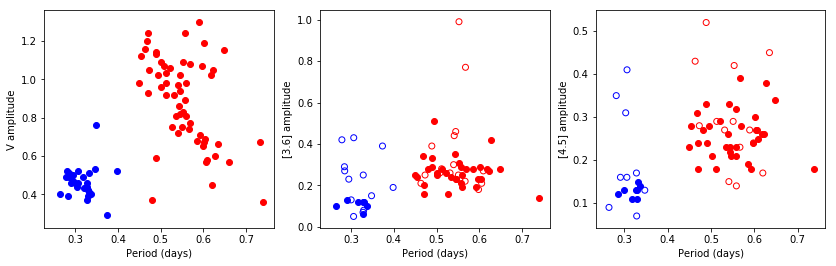

In [7]:
# bailey diagrams  
dtype = np.dtype([('name', 'S10'), ('period', float), ('type', 'S6'), ('dist', float), ('U', float), ('Uer', float), 
                    ('Uamp', float), ('B', float), ('Ber', float), ('Bamp', float), ('V', float),
                    ('Ver', float), ('Vamp', float), ('R', float), ('Rer', float), ('Ramp', float),
                    ('I', float), ('Ier', float), ('Iamp', float), ('J', float), ('Jer', float),
                    ('Jamp', float), ('H', float), ('Her', float), ('Hamp', float), ('K', float),
                    ('Ker', float), ('Kamp', float), ('3.6', float), ('3.6er', float), ('3.6amp', float),
                    ('4.5', float), ('4.5er', float), ('4.5amp', float)])
data = np.loadtxt(folder+'RRL-avg-mags.txt', dtype=dtype)


fig1 = mp.figure(figsize=(14,4))
ax1 = fig1.add_subplot(131)
ax1.scatter(data['period'][data['type'] == 'RR1'], data['Vamp'][data['type'] == 'RR1'], color='b')
ax1.scatter(data['period'][data['type'] == 'RR0'], data['Vamp'][data['type'] == 'RR0'], color='r')
unknownp = data['period'][(data['type'] != 'RR0') & (data['type'] != 'RR1')]
unknownV = data['Vamp'][(data['type'] != 'RR0') & (data['type'] != 'RR1')]
ax1.scatter(unknownp, unknownV, color='g')
ax1.set_xlabel('Period (days)')
ax1.set_ylabel('V amplitude')
#for label, x, y in zip(data['name'], data['period'], data['Vamp']):
#    ax1.annotate(label, xy=(x, y))

a1 = data['3.6amp'][data['3.6'] < 90]
a2 = data['4.5amp'][data['4.5'] < 90]
p1 = data['period'][data['3.6'] < 90]
p2 = data['period'][data['4.5'] < 90]
m1 = data['type'][data['3.6'] < 90]
m2 = data['type'][data['4.5'] < 90]
n1 = data['name'][data['3.6'] < 90]
n2 = data['name'][data['4.5'] < 90]

used_3p6 = np.in1d(n1, good_id1.compressed())
used_4p5 = np.in1d(n2, good_id2.compressed())
good_period_3p6 = p1[used_3p6 == True]
good_period_4p5 = p2[used_4p5 == True]
good_mode_3p6 = m1[used_3p6 == True]
good_mode_4p5 = m2[used_4p5 == True]
good_amp_3p6 = a1[used_3p6 == True]
good_amp_4p5 = a2[used_4p5 == True]
bad_period_3p6 = p1[used_3p6 == False]
bad_period_4p5 = p2[used_4p5 == False]
bad_mode_3p6 = m1[used_3p6 == False]
bad_mode_4p5 = m2[used_4p5 == False]
bad_amp_3p6 = a1[used_3p6 == False]
bad_amp_4p5 = a2[used_4p5 == False]

good_rrc = good_mode_3p6 == 'RR1'
good_rrab = good_mode_3p6 == 'RR0'
bad_rrc = bad_mode_3p6 == 'RR1'
bad_rrab = bad_mode_3p6 == 'RR0'
#fig2 = mp.figure(figsize=(14,6))
ax2 = fig1.add_subplot(132)
ax2.scatter(good_period_3p6[good_rrc], good_amp_3p6[good_rrc], color='b')
ax2.scatter(good_period_3p6[good_rrab], good_amp_3p6[good_rrab], color='r')
ax2.scatter(bad_period_3p6[bad_rrc], bad_amp_3p6[bad_rrc], color='b', facecolor='none')
ax2.scatter(bad_period_3p6[bad_rrab], bad_amp_3p6[bad_rrab], color='r', facecolor='none')
ax2.set_xlabel('Period (days)')
ax2.set_ylabel('[3.6] amplitude')

good_rrc = good_mode_4p5 == 'RR1'
good_rrab = good_mode_4p5 == 'RR0'
bad_rrc = bad_mode_4p5 == 'RR1'
bad_rrab = bad_mode_4p5 == 'RR0'
ax3 = fig1.add_subplot(133)
ax3.scatter(good_period_4p5[good_rrc], good_amp_4p5[good_rrc], color='b')
ax3.scatter(good_period_4p5[good_rrab], good_amp_4p5[good_rrab], color='r')
ax3.scatter(bad_period_4p5[bad_rrc], bad_amp_4p5[bad_rrc], color='b', facecolor='none')
ax3.scatter(bad_period_4p5[bad_rrab], bad_amp_4p5[bad_rrab], color='r', facecolor='none')
ax3.set_xlabel('Period (days)')
ax3.set_ylabel('[4.5] amplitude')

mp.savefig(folder+target+'-bailey.eps', format='eps')

49 stars were used in IRAC


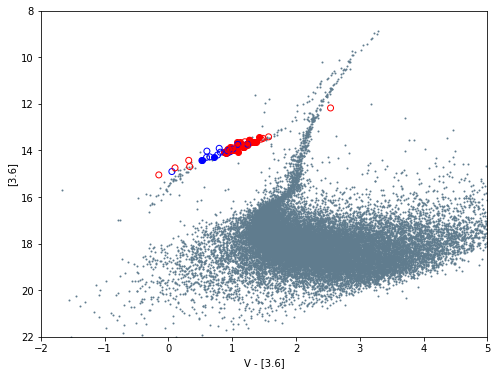

In [8]:
# new cmd diagrams  
catalog_data = analysis_routines.read_merged_catalog(folder)

# apply extinction
catalog_data['V'] = catalog_data['V'] - Rv*ebv*red_law[0]
catalog_data['3.6'] = catalog_data['3.6'] - Rv*ebv*red_law[1]
catalog_data['4.5'] = catalog_data['4.5'] - Rv*ebv*red_law[2]

thres = 300
thres2 = 150
dist = catalog_data['rad_dist']
color1 = catalog_data['V'][dist > thres2] - catalog_data['3.6'][dist > thres2]
mag = catalog_data['V'][dist > thres2]
mag1 = catalog_data['3.6'][dist > thres2]
err1 = catalog_data['3.6er'][dist > thres2]
color2 = catalog_data['V'][dist > thres2] - catalog_data['4.5'][dist > thres2]
mag2 = catalog_data['4.5'][dist > thres2]
err2 = catalog_data['4.5er'][dist > thres2]

dtype = np.dtype([('name', 'S10'), ('period', float), ('type', 'S6'), ('dist', float), ('U', float), ('Uer', float), 
                    ('Uamp', float), ('B', float), ('Ber', float), ('Bamp', float), ('V', float),
                    ('Ver', float), ('Vamp', float), ('R', float), ('Rer', float), ('Ramp', float),
                    ('I', float), ('Ier', float), ('Iamp', float), ('J', float), ('Jer', float),
                    ('Jamp', float), ('H', float), ('Her', float), ('Hamp', float), ('K', float),
                    ('Ker', float), ('Kamp', float), ('3.6', float), ('3.6er', float), ('3.6amp', float),
                    ('4.5', float), ('4.5er', float), ('4.5amp', float)])
data = np.loadtxt(folder+'RRL-avg-mags.txt', dtype=dtype)

a1 = data['3.6'][data['3.6'] < 90] - Rv*ebv*red_law[1]
m1 = data['type'][data['3.6'] < 90]
n1 = data['name'][data['3.6'] < 90]
a2 = data['V'][data['3.6'] < 90] - Rv*ebv*red_law[0]
n2 = data['name'][data['4.5'] < 90]

used_3p6 = np.in1d(n1, good_id1.compressed())
used_4p5 = np.in1d(n2, good_id2.compressed())
good_names = n1[used_3p6 == True]
good_names = np.append(good_names, n2[used_4p5 == True])
print '{} stars were used in IRAC'.format(len(np.unique(good_names)))

good_mode_3p6 = m1[used_3p6 == True]
good_3p6 = a1[used_3p6 == True]
good_V = a2[used_3p6 == True]

bad_mode_3p6 = m1[used_3p6 == False]
bad_3p6 = a1[used_3p6 == False]
bad_V = a2[used_3p6 == False]

good_rrc = good_mode_3p6 == 'RR1'
good_rrab = good_mode_3p6 == 'RR0'
bad_rrc = bad_mode_3p6 == 'RR1'
bad_rrab = bad_mode_3p6 == 'RR0'
fig1 = mp.figure(figsize=(8,6))
ax2 = fig1.add_subplot(111)
ax2.scatter(color1, mag1, s=1, edgecolor=None, color='xkcd:blue grey')
ax2.set_ylim((22,8))
ax2.set_xlim((-2,5))
ax2.scatter(good_V[good_rrc] - good_3p6[good_rrc], good_3p6[good_rrc], color='b')
ax2.scatter(good_V[good_rrab] - good_3p6[good_rrab], good_3p6[good_rrab], color='r')
ax2.scatter(bad_V[bad_rrc] - bad_3p6[bad_rrc], bad_3p6[bad_rrc], color='b', facecolor='none')
ax2.scatter(bad_V[bad_rrab] - bad_3p6[bad_rrab], bad_3p6[bad_rrab], color='r', facecolor='none')
ax2.set_xlabel('V - [3.6]')
ax2.set_ylabel('[3.6]')


mp.savefig(folder+target+'-cmd-fixed.eps', format='eps')